Tunes hyperparameters for technical indicators

Gets commodity data from yfinance

Gets macroeconomic data from FRED

Compares ML Algos performance

Uses LightGBM and XGBoost to predict one-day ahead returns

# 👉 <a id = "top">Table of Contents</a> 👈 

# [1. Functions](#p1)

> <font color = red> Commonly used functions in the workbook, such as those used to calculate performance measures and gragh drawdowns </font>

# [2. Trading Parameters](#p2)

> <font color = red> Main parameters of the trading strategies </font>

# [3. Momentum Strategies](#p3)

> <font color = red> Various trend following strategies </font>

### [3a. Moving Average Strategy](#p3a)

> <font color = red> Simple moving average crossover strategy </font>

### [3b. MACD Strategy](#p3b)

> <font color = red> Moving Average Convergence Divergence strategy </font>

# [4. Mean Reversion Strategies](#p4)

> <font color = red> Various mean reversion strategies </font>

### [4a. Bollinger Band Strategy](#p4a)

> <font color = red> Bollinger Band Strategy </font>

### [4b. RSI Strategy](#p4b)

> <font color = red> RSI Strategy </font>

# [5. Machine Learning Trading Strategies](#p5)

> <font color = red> Various ML strategies </font>

### [5a. Data Collection](#p5a)

> <font color = red> Getting additional data to feed into ML models </font>

##### [5ai. Load extra commodity data from yfinance](#p5ai)

> <font color = red> Collecting commodities data </font>

##### [5aii. Load Macroeconomic data from pandas-datareader](#p5aii)

> <font color = red> Collecting macroeconomic data </font>

### [5b. Transforming economic data before feeding into model](#p5b)

> <font color = red> Making sure the economic data makes sense </font>

### [5c. Feature Engineering](#p5c)

> <font color = red> Creating new variables from the raw data </font>

### [5d. Train-test split](#p5d)

> <font color = red> Split into training data and test data for ML models </font>

### [5e. Model Comparison](#p5e)

> <font color = red> Comparing various ML models </font>

### [5f. LightGBM](#p5f)

> <font color = red> Predict returns using LightGBM with hyperparameter tuning using Optuna </font>

### [5g. XGBoost](#p5g)

> <font color = red> Predict returns using XGBoost with hyperparameter tuning using Optuna </font>


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Yahoo finance
import yfinance as yf

# Pandas Datareader
import pandas_datareader as pdr

# Plotly
import plotly.express as px 
import plotly.graph_objects as go

# Datetime
import datetime as dt
from datetime import datetime
from datetime import timedelta

import lightgbm as lgb
import xgboost as xg
from xgboost import XGBRegressor
import graphviz
import copy
import gc
import optuna

from skgbm.tools import trees_to_dataframe

# Sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn import metrics 

from sklearn.linear_model import LinearRegression

# Regularization
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet

# Decision Tree
from sklearn.tree import DecisionTreeRegressor

# ENSEMBLE

## Bagging (BOOTSTRAPPED AGGREGATION)
from sklearn.ensemble import RandomForestRegressor    # Imputation of missing values
from sklearn.ensemble import ExtraTreesRegressor

## Boosting
from sklearn.ensemble import AdaBoostRegressor           # Adaptive Boosting
from sklearn.ensemble import GradientBoostingRegressor   # XGB -> eXtreme Gradient Boosting -> dummification (ENCODING)

# Support Vector Machine
from sklearn.svm import SVR

# K-Nearest Neighbor
from sklearn.neighbors import KNeighborsRegressor      # In econometrics, for matching and propensity scoring method

import statsmodels.tsa.arima.model as stats
import statsmodels.api as sm

import warnings
warnings.filterwarnings("ignore")

# <a id = "p1">1.</a>  <font color = "green"> Functions </font>  [back to table of contents](#top)

In [2]:
# This is used to calculate portfolio statistics and compare with long-only SP500

def calc_portfolio_statistics(portfolio_df: pd.DataFrame, 
                              SP500: pd.DataFrame, 
                              portfolio_name: str):
    
    # Ensure the index is a DatetimeIndex
    if not isinstance(portfolio_df.index, pd.DatetimeIndex):
        raise ValueError("The index of portfolio_df must be a DatetimeIndex")
    
    portfolio_statistics=portfolio_df

    portfolio_statistics['Returns']=portfolio_statistics["strategy_returns"]
    
    portfolio_statistics.dropna(subset="Returns",
                                axis=0,
                                inplace=True)
    
    # Filter only for dates in SP500 that are in the strategy dataframe
    SP500 = SP500.loc[SP500.index.intersection(portfolio_statistics.index)]
    
    #Calculate number of years as the last date in the index minus the first date in the index
    Number_of_years=((portfolio_statistics.index[-1]-portfolio_statistics.index[0]).days)/365.25   #Edit this as needed
    
    # Cumulative returns, drawdown, and high-water mark
    portfolio_statistics['CumulativeStrategyReturns'] = portfolio_statistics['Returns'].cumsum().apply(np.exp)
    portfolio_statistics['HighWaterMark'] = portfolio_statistics['CumulativeStrategyReturns'].cummax()
    portfolio_statistics['Drawdown'] = (portfolio_statistics['CumulativeStrategyReturns']/portfolio_statistics['HighWaterMark'])-1
    portfolio_statistics['MaxDrawdown'] = portfolio_statistics['Drawdown'].cummin()
    
    Last_date = portfolio_statistics[~portfolio_statistics['MaxDrawdown'].isna()].index[-1]
    
    # Convert index to a Series
    high_water_mark_date = pd.Series(portfolio_statistics.index, index=portfolio_statistics.index)
    
    # Calculate HighWaterMarkDate
    portfolio_statistics['HighWaterMarkDate'] = high_water_mark_date.where(portfolio_statistics['Drawdown'] == 0).fillna(method='ffill')
            
    portfolio_statistics['HighWaterMarkDate']=pd.to_datetime(portfolio_statistics['HighWaterMarkDate'])
    
    #Calculate duration of drawdown
    portfolio_statistics['DrawdownDuration'] = portfolio_statistics.index - portfolio_statistics['HighWaterMarkDate']

    #Calculate duration of maximum drawdown
    portfolio_statistics['MaximumDrawdownDuration'] = portfolio_statistics['DrawdownDuration'].cummax()
    
    Cumulative_Returns=(portfolio_statistics['CumulativeStrategyReturns'][Last_date])

    Annualized_Returns=(portfolio_statistics['CumulativeStrategyReturns'][Last_date]**(1/Number_of_years))-1

    Annualized_Standard_Deviation = portfolio_statistics['Returns'].std() *np.sqrt(252)    #Edit this as needed

    Negative_Standard_Deviation = portfolio_statistics['Returns'][portfolio_statistics['Returns']<0].std()*np.sqrt(252)    #Edit this as needed

    Sharpe_Ratio= round(Annualized_Returns/Annualized_Standard_Deviation,2)

    Sortino_Ratio=round(Annualized_Returns/Negative_Standard_Deviation,2)
    
    Calmar_Ratio=round(Annualized_Returns/portfolio_statistics['MaxDrawdown'][-1]*-1,2)

    MaxDrawdown=round(portfolio_statistics['MaxDrawdown'][-1]*100,2)
    
    MaxDrawdown_Duration=(portfolio_statistics['MaximumDrawdownDuration'][Last_date]).days

    #Calculate VaR measures
    var99=np.percentile(portfolio_statistics['Returns'], 1)
    var99_month=round(var99 * np.sqrt(21),2)*100
    var99_year=round(var99 * np.sqrt(252),2)*100
    var99=round(var99,2)*100
    
    #Calculate Information Ratio
    Tracking_Error=(portfolio_statistics['strategy_returns']-SP500['SPY_log_returns']).std()*np.sqrt(252)
    SP500_Annualized_Returns=(SP500['SPY_cumulative_returns'][Last_date]**(1/Number_of_years))-1
    Information_Ratio=round((Annualized_Returns-SP500_Annualized_Returns)/Tracking_Error,2)
    
    # For calculating beta
    stock_return = portfolio_statistics['strategy_returns']
    SP500_return = SP500['SPY_log_returns']

    # Compute rolling covariance and variance
    rolling_cov = stock_return.rolling(window=252).cov(SP500_return)
    rolling_var = SP500_return.rolling(window=252).var()   # Use SP500_return's variance

    # Calculate beta as covariance/variance
    beta = rolling_cov / rolling_var

    # Assign the result to beta_df
    portfolio_statistics["Rolling beta"] = beta
    
    Latest_beta=round(portfolio_statistics["Rolling beta"][-1],2)
    
    Treynor_Ratio=round(Annualized_Returns*100/Latest_beta,2)
    
    #Round values just before printing
    Cumulative_Returns=round(Cumulative_Returns*100,2)
    Annualized_Returns=round(Annualized_Returns*100,2)
    Annualized_Standard_Deviation=round(Annualized_Standard_Deviation*100,2)
    
    # Print the results
    print(f'During this period, {portfolio_name} Cumulative Return was {Cumulative_Returns}%')
    print(f'During this period, {portfolio_name} Annualized Return was {Annualized_Returns}%')
    print(f'During this period, {portfolio_name} Annualized Standard Deviation was {Annualized_Standard_Deviation}%')
    print(f'During this period, {portfolio_name} Sharpe Ratio was {Sharpe_Ratio}')
    print(f'During this period, {portfolio_name} Sortino Ratio was {Sortino_Ratio}')
    print(f'During this period, {portfolio_name} Calmar Ratio was {Calmar_Ratio}')
    print(f'During this period, {portfolio_name} Treynor Ratio was {Treynor_Ratio}')
    print(f'During this period, {portfolio_name} Max Drawdown was {MaxDrawdown}%')
    print(f'During this period, {portfolio_name} Max Drawdown Duration was {MaxDrawdown_Duration} days')
    print(f'During this period, {portfolio_name} 1 day VaR at the 99% CI was {var99} %')
    print(f'During this period, {portfolio_name} 1 month VaR at the 99% CI was {var99_month} %')
    print(f'During this period, {portfolio_name} 1 year VaR at the 99% CI was {var99_year} %')
    print(f'During this period, {portfolio_name} Information Ratio against SP500 was {Information_Ratio}')
    print(f'The past 12m {portfolio_name} Rolling Beta against SP500 was {Latest_beta}')
    
    return portfolio_statistics

In [3]:
#This is used to plot chart of strategy return alongside SPY returns

def plot_chart_with_SPY(portfolio_df: pd.DataFrame, 
                        SPY_info: pd.DataFrame, 
                        chart_title: str): 
    
    # Plot strategy cumulative returns against highwatermark
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=portfolio_df.index, 
        y=portfolio_df, 
        mode='lines', 
        name='Strategy Cumulative Returns'
    ))

    fig.add_trace(go.Scatter(
        x=SPY_info.index, 
        y=SPY_info["SPY_cumulative_returns"], 
        mode='lines', 
        name='SPY cumulative returns'
    ))

    fig.update_layout(
        title=chart_title,
        xaxis_title="Date",
        yaxis_title="Cumulative Capital",
        width=1200,  
        height=600
    )

    fig.show()

In [4]:
#This is used to plot chart of buy and sell positions along with Adj Close price of SPY

def plot_chart_with_buy_sell(portfolio_df: pd.DataFrame, 
                             chart_title: str):
    
    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=portfolio_df.index, 
            y=portfolio_df["Adj Close"], 
            mode='lines', 
            line=dict(color='grey', width=0.75), 
            name='SPY'
        )
    )

    fig.add_trace(
        go.Scatter(
            x=portfolio_df.loc[portfolio_df.Trades.isin([1.0, 2.0])].index, 
            y=portfolio_df["Adj Close"][portfolio_df.Trades.isin([1.0, 2.0])], 
            mode='markers', 
            marker=dict(symbol='triangle-up', color='green', size=10), 
            name='BUY Signal'
        )
    )

    fig.add_trace(
        go.Scatter(
            x=portfolio_df.loc[portfolio_df.Trades.isin([-1.0, -2.0])].index, 
            y=portfolio_df["Adj Close"][portfolio_df.Trades.isin([-1.0, -2.0])], 
            mode='markers', 
            marker=dict(symbol='triangle-down', color='red', size=10), 
            name='SELL Signal'
        )
    )

    fig.update_layout(
        title=chart_title,
        xaxis_title='Date',
        yaxis_title='SPY Price',
        width=1200,  
        height=600   
    )

    # Show figure
    fig.show()

In [5]:
#This is used to plot chart of buy and sell positions along with Adj Close price of SPY

def plot_chart_with_drawdown(portfolio_df: pd.DataFrame, 
                             chart_title: str):
    
    # Plot strategy cumulative returns against highwatermark
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=portfolio_df.index, 
        y=portfolio_df["CumulativeStrategyReturns"], 
        mode='lines', 
        name='Strategy Cumulative Returns'
    ))

    fig.add_trace(go.Scatter(
        x=portfolio_df.index, 
        y=portfolio_df["HighWaterMark"], 
        mode='lines', 
        name='Max Gross Performance'
    ))

    fig.update_layout(
        title=chart_title,
        xaxis_title="Date",
        yaxis_title="Cumulative Returns",
        yaxis=dict(tickformat=".2f"),
        width=1200,  
        height=600
    )

    fig.show()
    
    
    
    # Plot drawdown of strategy
    drawdown_df = portfolio_df[["Drawdown"]].dropna()

    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=drawdown_df.index, 
        y=drawdown_df["Drawdown"], 
        mode='lines', 
        name='Drawdown'
    ))

    fig.update_layout(
        title="Percentage Drawdown Over Time",
        xaxis_title="Date",
        yaxis_title="Percentage Drawdown",
        yaxis=dict(tickformat=".2f"),
        width=1200,  
        height=600
    )

    fig.show()

# <a id = "p2">2.</a>  <font color = "green"> Trading Parameters </font>  [back to table of contents](#top)

In [6]:
initial_capital = 100000
commission = 0

In [7]:
start_date = pd.to_datetime('2005-11-01', format='%Y-%m-%d')
end_date = pd.to_datetime('2024-11-01', format='%Y-%m-%d')

In [8]:
SPY_info = yf.download("SPY",
                          start = start_date,
                          end = end_date)

[*********************100%%**********************]  1 of 1 completed


In [9]:
SPY_info = SPY_info[["Adj Close"]]

In [10]:
SPY_info["SPY_log_returns"] =\
(
    np
    .log(SPY_info["Adj Close"] / SPY_info["Adj Close"].shift(1)
        )
)

In [11]:
SPY_info["SPY_cumulative_returns"] = \
    (
        initial_capital*SPY_info["SPY_log_returns"]
        .cumsum()
        .apply(np.exp)
    )

In [12]:
SPY_info

,Adj Close,SPY_log_returns,SPY_cumulative_returns
Date,,,
2005-11-01,83.991173,NaN,NaN
2005-11-02,84.869446,0.010402,101045.672993
2005-11-03,85.231926,0.004262,101477.242349
2005-11-04,85.120392,-0.001309,101344.449682
2005-11-07,85.204063,0.000982,101444.069162
...,...,...,...
2024-10-25,579.039978,-0.000345,689405.753949
2024-10-28,580.830017,0.003087,691536.976794
2024-10-29,581.770020,0.001617,692656.144929


In [13]:
#Cumulative Returns of SPY
plot_chart_with_SPY(portfolio_df = SPY_info["SPY_cumulative_returns"],
                    SPY_info = SPY_info,
                    chart_title=("SPY Cumulative Returns"))

## <a id = "p3">3.</a>  <font color = "green"> Momentum Trading Strategies </font>  [back to table of contents](#top)

### <a id = "p3a">3a.</a>  <font color = "green"> Moving Average Strategy </font>  [back to table of contents](#top)

In [14]:
SMA_start = 1
SMA_end = 30
LMA_start = 31
LMA_end = 60

In [15]:
def Moving_Average_Optimal_Hyperparameters (MA_df = SPY_info,
                                            SMA_start: int=SMA_start, 
                                            SMA_end: int=SMA_end, 
                                            LMA_start: int=LMA_start,
                                            LMA_end: int=LMA_end,
                                            initial_capital=initial_capital,
                                            commission=commission,
                                            Long_Short="Long Only"):
    
    '''
    SMA_start: Start of Short Moving Average to loop over
    SMA_end: End of Short Moving Average to loop over
    LMA_start: Start of Long Moving Average to loop over
    LMA_end: End of Long Moving Average to loop over
    initial_capital: Starting capital for the strategy
    commission: Trading commission for each trade
    '''
    
    if Long_Short == "Long Only":
        Short = 0
    else:
        Short = -1
    
    Number_of_permutations=(SMA_end-SMA_start+1)*(LMA_end-LMA_start+1)
    
    Moving_Average_Strategy_df=pd.DataFrame(index=range(0,Number_of_permutations),
                                            columns=["SMA","LMA","Final_Capital"])

    n=0
    for SMA in range (SMA_start,SMA_end+1):
        for LMA in range (LMA_start,LMA_end+1):
    
            Momentum_df=MA_df.copy()
            
            # Calculate the SMA and LMA
            Momentum_df["SMA"]=\
                (
                    Momentum_df["Adj Close"]
                    .rolling(window=SMA,min_periods=SMA)
                    .mean()
                )
                
            Momentum_df["LMA"]=\
                (
                    Momentum_df["Adj Close"]
                    .rolling(window=LMA,min_periods=LMA)
                    .mean()
                )

            # Enter long position (1) when SMA is above the LMA. 
            Momentum_df["Position"]=\
                (
                    np.where(Momentum_df["SMA"] > Momentum_df["LMA"],
                             1
                             ,0)
                )

            # Enter short position or neutral when SMA is below the LMA. 
            Momentum_df["Position"]=\
                (
                    np.where(Momentum_df["SMA"] < Momentum_df["LMA"],
                             Short,
                             Momentum_df["Position"])
                )

            Momentum_df["Trades"] =\
                (
                    Momentum_df["Position"]
                    .diff()
                )

            Momentum_df["log_returns"] =\
                (
                    np
                    .log(Momentum_df["Adj Close"] / Momentum_df["Adj Close"].shift(1)
                        )
                )

            Momentum_df["strategy_returns"] =\
                (
                    Momentum_df["Position"]
                    .shift(1) 
                    * 
                    Momentum_df["log_returns"]
                )
            
            # Drop rows with NaN values
            Momentum_df.dropna(inplace=True)
            
            # Initialize the Capital column with NaN values
            Momentum_df["Capital"]=np.nan
            
            # Set the first value of Capital to the initial value (initial_capital)
            Momentum_df.iloc[0, Momentum_df.columns.get_loc("Capital")] = initial_capital
            
            # Loop through each row starting from the second row to calculate capital
            for row in range(1, len(Momentum_df)):
                
                Trade=abs(Momentum_df.iloc[row, Momentum_df.columns.get_loc("Trades")])

                # Update the capital based on the previous capital and strategy returns
                Momentum_df.iloc[row, Momentum_df.columns.get_loc("Capital")] = Momentum_df.iloc[row-1, Momentum_df.columns.get_loc("Capital")] * \
                    (np.exp(Momentum_df.iloc[row, Momentum_df.columns.get_loc("strategy_returns")])) - Trade * commission
            
            Final_Capital=Momentum_df.iloc[-1, Momentum_df.columns.get_loc("Capital")]
            
            Moving_Average_Strategy_df.iloc[n,Moving_Average_Strategy_df.columns.get_loc("SMA")]=SMA
            Moving_Average_Strategy_df.iloc[n,Moving_Average_Strategy_df.columns.get_loc("LMA")]=LMA
            Moving_Average_Strategy_df.iloc[n,Moving_Average_Strategy_df.columns.get_loc("Final_Capital")]=Final_Capital
            
            n=n+1
        
    return Moving_Average_Strategy_df

In [16]:
Optimal_Moving_Average = Moving_Average_Optimal_Hyperparameters (MA_df = SPY_info,
                                                            SMA_start = SMA_start, 
                                                            SMA_end = SMA_end, 
                                                            LMA_start = LMA_start,
                                                            LMA_end = LMA_end,
                                                            initial_capital = initial_capital,
                                                            commission = commission,
                                                            Long_Short="Long Only")

In [17]:
Optimal_Moving_Average

,SMA,LMA,Final_Capital
0,1,31,336356.712148
1,1,32,289501.820522
2,1,33,283005.089184
3,1,34,267483.186721
4,1,35,248244.905941
...,...,...,...
895,30,56,320513.238668
896,30,57,287689.842395
897,30,58,284255.973577
898,30,59,288016.891451


In [18]:
# These are the optimal Moving Average parameters and the expected final capital using these parameters

max_capital_index = Optimal_Moving_Average['Final_Capital'].idxmax()
Optimal_Moving_Average.loc[max_capital_index]

SMA                         15
LMA                         42
Final_Capital    411118.775391
Name: 431, dtype: object

In [19]:
# Use the optimal Moving Average parameters for the Moving Average Strategy

# These are the optimal hyperparameters for long-short, if you dont want to optimize again
# SMA=15
# LMA=42

# These are the optimal hyperparameters for long only, if you dont want to optimize again
# SMA=15
# LMA=42

SMA = Optimal_Moving_Average.loc[max_capital_index,"SMA"]
LMA = Optimal_Moving_Average.loc[max_capital_index,"LMA"]

In [20]:
def Moving_Average_Strategy_Returns (MA_df = SPY_info,
                                    SMA=SMA, 
                                    LMA=LMA,
                                    initial_capital=initial_capital,
                                    commission=commission,
                                    Long_Short="Long Only"):
    
    '''
    SMA: Short Moving Average
    LMA: Long Moving Average
    initial_capital: Starting capital for the strategy
    commission: Trading commission for each trade
    '''
    
    if Long_Short == "Long Only":
        Short = 0
    else:
        Short = -1
    
    Momentum_df=MA_df.copy()
    
    # Calculate the SMA and LMA
    Momentum_df["SMA"]=\
        (
            Momentum_df["Adj Close"]
            .rolling(window=SMA,min_periods=SMA)
            .mean()
        )
        
    Momentum_df["LMA"]=\
        (
            Momentum_df["Adj Close"]
            .rolling(window=LMA,min_periods=LMA)
            .mean()
        )

    # Enter long position (1) when SMA is above the LMA. 
    Momentum_df["Position"]=\
        (
            np.where(Momentum_df["SMA"] > Momentum_df["LMA"],
                        1
                        ,0)
        )

    # Enter short position or neutral when SMA is below the LMA. 
    Momentum_df["Position"]=\
        (
            np.where(Momentum_df["SMA"] < Momentum_df["LMA"],
                        Short,
                        Momentum_df["Position"])
        )

    Momentum_df["Trades"] =\
    (
        Momentum_df["Position"]
        .diff()
    )

    Momentum_df["log_returns"] =\
    (
        np
        .log(Momentum_df["Adj Close"] / Momentum_df["Adj Close"].shift(1)
            )
    )

    Momentum_df["strategy_returns"] =\
    (
        Momentum_df["Position"]
        .shift(1) 
        * 
        Momentum_df["log_returns"]
    )
    
    # Drop rows with NaN values
    Momentum_df.dropna(inplace=True)
    
    # Initialize the Capital column with NaN values
    Momentum_df["Capital"]=np.nan
    
    # Set the first value of Capital to the initial value (initial_capital)
    Momentum_df.iloc[0, Momentum_df.columns.get_loc("Capital")] = initial_capital
    
    # Loop through each row starting from the second row to calculate capital
    for row in range(1, len(Momentum_df)):
        
        Trade=abs(Momentum_df.iloc[row, Momentum_df.columns.get_loc("Trades")])

        # Update the capital based on the previous capital and strategy returns
        Momentum_df.iloc[row, Momentum_df.columns.get_loc("Capital")] = Momentum_df.iloc[row-1, Momentum_df.columns.get_loc("Capital")] * \
            (np.exp(Momentum_df.iloc[row, Momentum_df.columns.get_loc("strategy_returns")])) - Trade * commission
    
    Final_Capital=Momentum_df.iloc[-1, Momentum_df.columns.get_loc("Capital")]
    
    print (f"The final capital of a moving average crossover strategy on SPY over this time period with a SMA of {SMA} days, LMA of {LMA} days and starting capital of ${initial_capital} is ${Final_Capital:.2f}")
           
    return Momentum_df

In [21]:
Moving_Average_df = Moving_Average_Strategy_Returns (MA_df = SPY_info,
                                                    SMA=SMA, 
                                                    LMA=LMA, 
                                                    initial_capital=initial_capital,
                                                    commission=commission,
                                                    Long_Short="Long Only")

The final capital of a moving average crossover strategy on SPY over this time period with a SMA of 15 days, LMA of 42 days and starting capital of $100000 is $411118.78


In [22]:
Moving_Average_df 

,Adj Close,SPY_log_returns,SPY_cumulative_returns,SMA,LMA,Position,Trades,log_returns,strategy_returns,Capital
Date,,,,,,,,,,
2005-12-30,87.253479,-0.005447,103884.106038,88.311197,87.368005,1,1.0,-0.005447,-0.000000,100000.000000
2006-01-03,88.788170,0.017436,105711.310976,88.359603,87.482220,1,0.0,0.017436,0.017436,101758.887868
2006-01-04,89.208649,0.004725,106211.933609,88.430464,87.585534,1,0.0,0.004725,0.004725,102240.792803
2006-01-05,89.264709,0.000628,106278.679660,88.465095,87.681553,1,0.0,0.000628,0.000628,102305.043297
2006-01-06,90.007553,0.008287,107163.110253,88.526015,87.797914,1,0.0,0.008287,0.008287,103156.406058
...,...,...,...,...,...,...,...,...,...,...
2024-10-25,579.039978,-0.000345,689405.753949,579.358667,567.632557,1,0.0,-0.000345,-0.000345,418637.803420
2024-10-28,580.830017,0.003087,691536.976794,580.227336,568.209634,1,0.0,0.003087,0.003087,419931.976620
2024-10-29,581.770020,0.001617,692656.144929,580.800671,568.807906,1,0.0,0.001617,0.001617,420611.585234


In [23]:
Moving_Average_df = calc_portfolio_statistics(portfolio_df=Moving_Average_df,
                                              SP500=SPY_info,
                                              portfolio_name=f"Moving Average Strategy")

During this period, Moving Average Strategy Cumulative Return was 411.12%
During this period, Moving Average Strategy Annualized Return was 7.79%
During this period, Moving Average Strategy Annualized Standard Deviation was 11.59%
During this period, Moving Average Strategy Sharpe Ratio was 0.67
During this period, Moving Average Strategy Sortino Ratio was 0.69
During this period, Moving Average Strategy Calmar Ratio was 0.39
During this period, Moving Average Strategy Treynor Ratio was 10.39
During this period, Moving Average Strategy Max Drawdown was -20.24%
During this period, Moving Average Strategy Max Drawdown Duration was 872 days
During this period, Moving Average Strategy 1 day VaR at the 99% CI was -2.0 %
During this period, Moving Average Strategy 1 month VaR at the 99% CI was -11.0 %
During this period, Moving Average Strategy 1 year VaR at the 99% CI was -38.0 %
During this period, Moving Average Strategy Information Ratio against SP500 was -6.16
The past 12m Moving Averag

In [24]:
#Cumulative Returns of Moving Average Strategy alongside SPY
plot_chart_with_SPY(portfolio_df = Moving_Average_df["Capital"],
                    SPY_info = SPY_info,
                    chart_title=("Moving Average vs SPY Cumulative Returns"))

In [25]:
plot_chart_with_buy_sell(portfolio_df = Moving_Average_df, 
                        chart_title = "Buy Sell positions of Moving Average Strategy")

In [26]:
plot_chart_with_drawdown(portfolio_df = Moving_Average_df, 
                         chart_title = "Drawdown of Moving Average Strategy")

### <a id = "p3b">3b.</a>  <font color = "green"> MACD Strategy </font>  [back to table of contents](#top)

In [27]:
MACD_slow_start=20
MACD_slow_end=30

MACD_fast_start=5
MACD_fast_end=15

MACD_signal_line_start=5
MACD_signal_line_end=15

In [28]:
def MACD_Optimal_Hyperparameters (MACD_df = SPY_info,
                                  MACD_slow_start: int=MACD_slow_start,
                                  MACD_slow_end: int=MACD_slow_end,
                                  MACD_fast_start: int=MACD_fast_start,
                                  MACD_fast_end: int=MACD_fast_end,
                                  MACD_signal_line_start: int=MACD_signal_line_start,
                                  MACD_signal_line_end: int=MACD_signal_line_end,
                                  initial_capital=initial_capital,
                                  commission=commission,
                                  Long_Short="Long Only"):
    
    '''
    initial_capital: Starting capital for the strategy
    commission: Trading commission for each trade
    '''
    
    if Long_Short == "Long Only":
        Short = 0
    else:
        Short = -1
    
    Number_of_permutations=(MACD_slow_end-MACD_slow_start+1)*(MACD_fast_end-MACD_fast_start+1)*(MACD_signal_line_end-MACD_signal_line_start+1)
    
    MACD_Strategy_df=pd.DataFrame(index=range(0,Number_of_permutations),
                                            columns=["MACD_slow","MACD_fast","MACD_signal_line","Final_Capital"])

    n=0
    for MACD_slow in range (MACD_slow_start,MACD_slow_end+1):
        for MACD_fast in range (MACD_fast_start,MACD_fast_end+1):
            for MACD_signal_line in range (MACD_signal_line_start,MACD_signal_line_end+1):
    
                Momentum_df=MACD_df.copy()
                
                # Calculate the Slow, Fast and MACD signal lines
                Momentum_df["Slow"]=Momentum_df["Adj Close"].ewm(span=MACD_slow).mean()
                Momentum_df["Fast"]=Momentum_df["Adj Close"].ewm(span=MACD_fast).mean()
                Momentum_df["MACD"]=Momentum_df["Fast"]-Momentum_df["Slow"]
                Momentum_df["MACD_Signal"]=Momentum_df["MACD"].ewm(span=MACD_signal_line).mean()

                # Enter long position (1) when MACD is above the MACD_Signal, otherwise, be neutral or short
                Momentum_df["Position"] =\
                    (
                        np.where(Momentum_df["MACD"] > Momentum_df["MACD_Signal"],
                                 1,
                                 Short)
                    )

                Momentum_df["Trades"] =\
                    (
                        Momentum_df["Position"]
                        .diff()
                    )

                Momentum_df["log_returns"] =\
                    (
                        np
                        .log(Momentum_df["Adj Close"] / Momentum_df["Adj Close"].shift(1)
                            )
                    )

                Momentum_df["strategy_returns"] =\
                    (
                        Momentum_df["Position"]
                        .shift(1) 
                        * 
                        Momentum_df["log_returns"]
                    )
                
                # Drop rows with NaN values
                Momentum_df.dropna(inplace=True)
                
                # Initialize the Capital column with NaN values
                Momentum_df["Capital"]=np.nan
                
                # Set the first value of Capital to the initial value (initial_capital)
                Momentum_df.iloc[0, Momentum_df.columns.get_loc("Capital")] = initial_capital
                
                # Loop through each row starting from the second row to calculate capital
                for row in range(1, len(Momentum_df)):
                    
                    Trade=abs(Momentum_df.iloc[row, Momentum_df.columns.get_loc("Trades")])

                    # Update the capital based on the previous capital and strategy returns
                    Momentum_df.iloc[row, Momentum_df.columns.get_loc("Capital")] = Momentum_df.iloc[row-1, Momentum_df.columns.get_loc("Capital")] * \
                        (np.exp(Momentum_df.iloc[row, Momentum_df.columns.get_loc("strategy_returns")])) - Trade * commission
                
                Final_Capital=Momentum_df.iloc[-1, Momentum_df.columns.get_loc("Capital")]
                
                MACD_Strategy_df.iloc[n,MACD_Strategy_df.columns.get_loc("MACD_slow")]=MACD_slow
                MACD_Strategy_df.iloc[n,MACD_Strategy_df.columns.get_loc("MACD_fast")]=MACD_fast
                MACD_Strategy_df.iloc[n,MACD_Strategy_df.columns.get_loc("MACD_signal_line")]=MACD_signal_line
                MACD_Strategy_df.iloc[n,MACD_Strategy_df.columns.get_loc("Final_Capital")]=Final_Capital
                
                n=n+1
            
    return MACD_Strategy_df

In [29]:
Optimal_MACD = MACD_Optimal_Hyperparameters (MACD_df = SPY_info,
                                            MACD_slow_start=MACD_slow_start,
                                            MACD_slow_end=MACD_slow_end,
                                            MACD_fast_start=MACD_fast_start,
                                            MACD_fast_end=MACD_fast_end,
                                            MACD_signal_line_start=MACD_signal_line_start,
                                            MACD_signal_line_end=MACD_signal_line_end,
                                            initial_capital=initial_capital,
                                            commission=commission,
                                            Long_Short="Long Only")

In [30]:
Optimal_MACD

,MACD_slow,MACD_fast,MACD_signal_line,Final_Capital
0,20,5,5,189739.385147
1,20,5,6,194353.642856
2,20,5,7,212490.986678
3,20,5,8,223905.626725
4,20,5,9,269795.049812
...,...,...,...,...
1326,30,15,11,260772.954228
1327,30,15,12,232305.525347
1328,30,15,13,238678.780911
1329,30,15,14,218787.734469


In [31]:
# These are the optimal MACD parameters and the expected final capital using these parameters

max_capital_index = Optimal_MACD['Final_Capital'].idxmax()
Optimal_MACD.loc[max_capital_index]

MACD_slow                      27
MACD_fast                       6
MACD_signal_line               15
Final_Capital       329718.608317
Name: 868, dtype: object

In [32]:
# Use the optimal MACD parameters for the MACD Strategy

# These are the optimal hyperparameters for long-short, if you dont want to optimize again
# MACD_slow = 27
# MACD_fast = 6
# MACD_signal_line = 15

# These are the optimal hyperparameters for long only, if you dont want to optimize again
# MACD_slow = 27
# MACD_fast = 6
# MACD_signal_line = 15

MACD_slow = Optimal_MACD.loc[max_capital_index,"MACD_slow"]
MACD_fast = Optimal_MACD.loc[max_capital_index,"MACD_fast"]
MACD_signal_line = Optimal_MACD.loc[max_capital_index,"MACD_signal_line"]

In [33]:
def MACD_Strategy_Returns (MACD_df = SPY_info,
                            MACD_slow = MACD_slow, 
                            MACD_fast = MACD_fast,
                            MACD_signal_line = MACD_signal_line,
                            initial_capital = initial_capital,
                            commission = commission,
                            Long_Short="Long Only"):
    
    '''
    SMA: Short Moving Average
    LMA: Long Moving Average
    initial_capital: Starting capital for the strategy
    commission: Trading commission for each trade
    '''
    
    if Long_Short == "Long Only":
        Short = 0
    else:
        Short = -1
    
    Momentum_df=MACD_df.copy()
    
    # Calculate the Slow, Fast and MACD signal lines
    Momentum_df["Slow"]=Momentum_df["Adj Close"].ewm(span=MACD_slow).mean()
    Momentum_df["Fast"]=Momentum_df["Adj Close"].ewm(span=MACD_fast).mean()
    Momentum_df["MACD"]=Momentum_df["Fast"]-Momentum_df["Slow"]
    Momentum_df["MACD_Signal"]=Momentum_df["MACD"].ewm(span=MACD_signal_line).mean()
    
    # Enter long position (1) when MACD is above the MACD_Signal, otherwise, be neutral or short
    Momentum_df["Position"] =\
        (
            np.where(Momentum_df["MACD"] > Momentum_df["MACD_Signal"],
                        1,
                        Short)
        )

    Momentum_df["Trades"] =\
        (
            Momentum_df["Position"]
            .diff()
        )

    Momentum_df["log_returns"] =\
        (
            np
            .log(Momentum_df["Adj Close"] / Momentum_df["Adj Close"].shift(1)
                )
        )

    Momentum_df["strategy_returns"] =\
        (
            Momentum_df["Position"]
            .shift(1) 
            * 
            Momentum_df["log_returns"]
        )
    
    # Drop rows with NaN values
    Momentum_df.dropna(inplace=True)
    
    # Initialize the Capital column with NaN values
    Momentum_df["Capital"]=np.nan
    
    # Set the first value of Capital to the initial value (initial_capital)
    Momentum_df.iloc[0, Momentum_df.columns.get_loc("Capital")] = initial_capital
    
    # Loop through each row starting from the second row to calculate capital
    for row in range(1, len(Momentum_df)):
        
        Trade=abs(Momentum_df.iloc[row, Momentum_df.columns.get_loc("Trades")])

        # Update the capital based on the previous capital and strategy returns
        Momentum_df.iloc[row, Momentum_df.columns.get_loc("Capital")] = Momentum_df.iloc[row-1, Momentum_df.columns.get_loc("Capital")] * \
            (np.exp(Momentum_df.iloc[row, Momentum_df.columns.get_loc("strategy_returns")])) - Trade * commission
    
    Final_Capital=Momentum_df.iloc[-1, Momentum_df.columns.get_loc("Capital")]
    
    print (f"The final capital of a MACD strategy on SPY over this time period with a MACD_slow of {MACD_slow} days, MACD_fast of {MACD_fast} days and MACD_signal_line of {MACD_signal_line} days, starting capital of ${initial_capital} is ${Final_Capital:.2f}")
           
    return Momentum_df

In [34]:
MACD_df = MACD_Strategy_Returns (MACD_df = SPY_info,
                                MACD_slow = MACD_slow, 
                                MACD_fast = MACD_fast,
                                MACD_signal_line = MACD_signal_line,
                                initial_capital = initial_capital,
                                commission = commission,
                                Long_Short="Long Only")

The final capital of a MACD strategy on SPY over this time period with a MACD_slow of 27 days, MACD_fast of 6 days and MACD_signal_line of 15 days, starting capital of $100000 is $329718.61


In [35]:
MACD_df = calc_portfolio_statistics(portfolio_df=MACD_df,
                                    SP500=SPY_info,
                                    portfolio_name=f"MACD Strategy")

During this period, MACD Strategy Cumulative Return was 329.72%
During this period, MACD Strategy Annualized Return was 6.48%
During this period, MACD Strategy Annualized Standard Deviation was 11.36%
During this period, MACD Strategy Sharpe Ratio was 0.57
During this period, MACD Strategy Sortino Ratio was 0.5
During this period, MACD Strategy Calmar Ratio was 0.22
During this period, MACD Strategy Treynor Ratio was 15.81
During this period, MACD Strategy Max Drawdown was -29.2%
During this period, MACD Strategy Max Drawdown Duration was 855 days
During this period, MACD Strategy 1 day VaR at the 99% CI was -2.0 %
During this period, MACD Strategy 1 month VaR at the 99% CI was -11.0 %
During this period, MACD Strategy 1 year VaR at the 99% CI was -37.0 %
During this period, MACD Strategy Information Ratio against SP500 was -6.13
The past 12m MACD Strategy Rolling Beta against SP500 was 0.41


In [36]:
#Cumulative Returns of Moving Average Strategy alongside SPY
plot_chart_with_SPY(portfolio_df = MACD_df["Capital"],
                    SPY_info = SPY_info,
                    chart_title=("MACD vs SPY Cumulative Returns"))

In [37]:
plot_chart_with_buy_sell(portfolio_df = MACD_df, 
                        chart_title = "Buy Sell positions of MACD Strategy")

In [38]:
plot_chart_with_drawdown(portfolio_df = MACD_df, 
                         chart_title = "Drawdown of MACD Strategy")

## <a id = "p4">4.</a>  <font color = "green"> Mean Reversion Trading Strategies </font>  [back to table of contents](#top)

### <a id = "p4a">4a.</a>  <font color = "green"> Bollinger Band Trading Strategy </font>  [back to table of contents](#top)

In [39]:
BB_SMA_start = 30
BB_SMA_end = 60

BB_threshold_start = 1.0
BB_threshold_end = 3.0

In [40]:
def BB_Optimal_Hyperparameters (BB_df = SPY_info,
                                  BB_SMA_start: int=BB_SMA_start,
                                  BB_SMA_end: int=BB_SMA_end,
                                  BB_threshold_start: float=BB_threshold_start,
                                  BB_threshold_end: float=BB_threshold_end,
                                  initial_capital=initial_capital,
                                  commission=commission,
                                  Long_Short="Long Only"):
    
    '''
    initial_capital: Starting capital for the strategy
    commission: Trading commission for each trade
    '''
    
    if Long_Short == "Long Only":
        Short = 0
    else:
        Short = -1
    
    Number_of_permutations=(BB_SMA_end-BB_SMA_start+1)*(BB_threshold_end-BB_threshold_start+0.1)*10
    
    BB_Strategy_df=pd.DataFrame(index=range(0,int(Number_of_permutations)),
                                            columns=["BB_SMA","BB_threshold","Final_Capital"])

    n=0
    for BB_SMA in range (BB_SMA_start,BB_SMA_end+1):
        for BB_threshold in np.arange(BB_threshold_start, BB_threshold_end + 0.1, 0.1).round(1):
    
                MR_df=BB_df.copy()
                
                MR_df["SMA"]=\
                    (
                        MR_df
                        ["Adj Close"]
                        .rolling(window=BB_SMA,min_periods=BB_SMA)
                        .mean()
                    )
                    
                # Note that standard deviation is calculated using the original price series, not the SMA

                MR_df["Upper_Band"]=\
                    (
                        MR_df["SMA"]
                        +
                        MR_df["Adj Close"]
                        .rolling(window=BB_SMA,min_periods=BB_SMA)
                        .std()
                        *BB_threshold
                    )


                MR_df["Lower_Band"]=\
                    (
                        MR_df["SMA"]
                        -MR_df["Adj Close"]
                        .rolling(window=BB_SMA,min_periods=BB_SMA)
                        .std()
                        *BB_threshold
                    )
                    
                MR_df.dropna(inplace=True)
    
                # Enter short or neutral position when price is above the upper band. Exit short position and be flat when price returns to within the band.
                MR_df["Position"]=\
                    (
                        np.where(MR_df["Adj Close"] 
                                > 
                                MR_df["Upper_Band"],
                                Short,
                                0)
                    )

                # Enter long position (1) when price is below the lower band. Exit long position and be flat when price returns to within the band.
                MR_df["Position"]=\
                    (
                        np.where(MR_df["Adj Close"] 
                                < 
                                MR_df["Lower_Band"],
                                1,
                                MR_df["Position"])
                    )
                    
                MR_df["Trades"] =\
                    (
                        MR_df["Position"]
                        .diff()
                    )

                MR_df["log_returns"] =\
                    (
                        np
                        .log(MR_df["Adj Close"] / MR_df["Adj Close"].shift(1)
                            )
                    )

                MR_df["strategy_returns"] =\
                    (
                        MR_df["Position"]
                        .shift(1) 
                        * 
                        MR_df["log_returns"]
                    )
                
                # Drop rows with NaN values
                MR_df.dropna(inplace=True)
                
                # Initialize the Capital column with NaN values
                MR_df["Capital"]=np.nan
                
                # Set the first value of Capital to the initial value (initial_capital)
                MR_df.iloc[0, MR_df.columns.get_loc("Capital")] = initial_capital
                
                # Loop through each row starting from the second row to calculate capital
                for row in range(1, len(MR_df)):
                    
                    Trade=abs(MR_df.iloc[row, MR_df.columns.get_loc("Trades")])

                    # Update the capital based on the previous capital and strategy returns
                    MR_df.iloc[row, MR_df.columns.get_loc("Capital")] = MR_df.iloc[row-1, MR_df.columns.get_loc("Capital")] * \
                        (np.exp(MR_df.iloc[row, MR_df.columns.get_loc("strategy_returns")])) - Trade * commission
                
                Final_Capital=MR_df.iloc[-1, MR_df.columns.get_loc("Capital")]
                
                BB_Strategy_df.iloc[n,BB_Strategy_df.columns.get_loc("BB_SMA")]=BB_SMA
                BB_Strategy_df.iloc[n,BB_Strategy_df.columns.get_loc("BB_threshold")]=BB_threshold
                BB_Strategy_df.iloc[n,BB_Strategy_df.columns.get_loc("Final_Capital")]=Final_Capital
                
                n=n+1
            
    return BB_Strategy_df

In [41]:
Optimal_BB = BB_Optimal_Hyperparameters (BB_df = SPY_info,
                                        BB_SMA_start = BB_SMA_start,
                                        BB_SMA_end = BB_SMA_end,
                                        BB_threshold_start = BB_threshold_start,
                                        BB_threshold_end = BB_threshold_end,
                                        initial_capital = initial_capital,
                                        commission = commission,
                                        Long_Short="Long Only")

In [42]:
Optimal_BB

,BB_SMA,BB_threshold,Final_Capital
0,30,1.0,163478.614445
1,30,1.1,161710.265749
2,30,1.2,190937.632793
3,30,1.3,190361.352987
4,30,1.4,238540.064557
...,...,...,...
646,60,2.6,118053.527822
647,60,2.7,125932.663226
648,60,2.8,138652.558032
649,60,2.9,123951.295937


In [43]:
# These are the optimal BB parameters and the expected final capital using these parameters

max_capital_index = Optimal_BB['Final_Capital'].idxmax()
Optimal_BB.loc[max_capital_index]

BB_SMA                      36
BB_threshold               1.2
Final_Capital    246013.316224
Name: 128, dtype: object

In [44]:
# Use the optimal BB parameters for the BB Strategy

# These are the optimal hyperparameters for long-short, if you dont want to optimize again
# BB_SMA = 30
# BB_threshold = 1.4

# These are the optimal hyperparameters for long only, if you dont want to optimize again
# BB_SMA = 36
# BB_threshold = 1.2

BB_SMA = Optimal_BB.loc[max_capital_index,"BB_SMA"]
BB_threshold = Optimal_BB.loc[max_capital_index,"BB_threshold"]

In [45]:
def BB_Strategy_Returns (BB_df = SPY_info,
                        BB_SMA: int=BB_SMA,
                        BB_threshold: float=BB_threshold,
                        initial_capital=initial_capital,
                        commission=commission,
                        Long_Short="Long Only"):
    
    '''
    initial_capital: Starting capital for the strategy
    commission: Trading commission for each trade
    '''
    
    if Long_Short == "Long Only":
        Short = 0
    else:
        Short = -1
    
    MR_df=BB_df.copy()
    
    MR_df["SMA"]=\
        (
            MR_df
            ["Adj Close"]
            .rolling(window=BB_SMA,min_periods=BB_SMA)
            .mean()
        )
        
    # Note that standard deviation is calculated using the original price series, not the SMA

    MR_df["Upper_Band"]=\
        (
            MR_df["SMA"]
            +
            MR_df["Adj Close"]
            .rolling(window=BB_SMA,min_periods=BB_SMA)
            .std()
            *BB_threshold
        )


    MR_df["Lower_Band"]=\
        (
            MR_df["SMA"]
            -MR_df["Adj Close"]
            .rolling(window=BB_SMA,min_periods=BB_SMA)
            .std()
            *BB_threshold
        )
        
    MR_df.dropna(inplace=True)

    # Enter short or neutral position when price is above the upper band. Exit short position and be flat when price returns to within the band.
    MR_df["Position"]=\
        (
            np.where(MR_df["Adj Close"] 
                    > 
                    MR_df["Upper_Band"],
                    Short,
                    0)
        )

    # Enter long position (1) when price is below the lower band. Exit long position and be flat when price returns to within the band.
    MR_df["Position"]=\
        (
            np.where(MR_df["Adj Close"] 
                    < 
                    MR_df["Lower_Band"],
                    1,
                    MR_df["Position"])
        )
        
    MR_df["Trades"] =\
        (
            MR_df["Position"]
            .diff()
        )

    MR_df["log_returns"] =\
        (
            np
            .log(MR_df["Adj Close"] / MR_df["Adj Close"].shift(1)
                )
        )

    MR_df["strategy_returns"] =\
        (
            MR_df["Position"]
            .shift(1) 
            * 
            MR_df["log_returns"]
        )
    
    # Drop rows with NaN values
    MR_df.dropna(inplace=True)
    
    # Initialize the Capital column with NaN values
    MR_df["Capital"]=np.nan
    
    # Set the first value of Capital to the initial value (initial_capital)
    MR_df.iloc[0, MR_df.columns.get_loc("Capital")] = initial_capital
    
    # Loop through each row starting from the second row to calculate capital
    for row in range(1, len(MR_df)):
        
        Trade=abs(MR_df.iloc[row, MR_df.columns.get_loc("Trades")])

        # Update the capital based on the previous capital and strategy returns
        MR_df.iloc[row, MR_df.columns.get_loc("Capital")] = MR_df.iloc[row-1, MR_df.columns.get_loc("Capital")] * \
            (np.exp(MR_df.iloc[row, MR_df.columns.get_loc("strategy_returns")])) - Trade * commission
    
    Final_Capital=MR_df.iloc[-1, MR_df.columns.get_loc("Capital")]
    
    print (f"The final capital of a BB strategy on SPY over this time period with a BB_SMA of {BB_SMA} days, BB_threshold of {BB_threshold} SD, starting capital of ${initial_capital} is ${Final_Capital:.2f}")
            
    return MR_df

In [46]:
BB_df = BB_Strategy_Returns (BB_df = SPY_info,
                        BB_SMA = BB_SMA,
                        BB_threshold = BB_threshold,
                        initial_capital = initial_capital,
                        commission = commission,
                        Long_Short="Long Only")

The final capital of a BB strategy on SPY over this time period with a BB_SMA of 36 days, BB_threshold of 1.2 SD, starting capital of $100000 is $246013.32


In [47]:
BB_df = calc_portfolio_statistics(portfolio_df=BB_df,
                                SP500=SPY_info,
                                portfolio_name=f"BB Strategy")

During this period, BB Strategy Cumulative Return was 246.01%
During this period, BB Strategy Annualized Return was 4.89%
During this period, BB Strategy Annualized Standard Deviation was 12.42%
During this period, BB Strategy Sharpe Ratio was 0.39
During this period, BB Strategy Sortino Ratio was 0.18
During this period, BB Strategy Calmar Ratio was 0.17
During this period, BB Strategy Treynor Ratio was 32.6
During this period, BB Strategy Max Drawdown was -28.05%
During this period, BB Strategy Max Drawdown Duration was 793 days
During this period, BB Strategy 1 day VaR at the 99% CI was -2.0 %
During this period, BB Strategy 1 month VaR at the 99% CI was -10.0 %
During this period, BB Strategy 1 year VaR at the 99% CI was -36.0 %
During this period, BB Strategy Information Ratio against SP500 was -6.61
The past 12m BB Strategy Rolling Beta against SP500 was 0.15


In [48]:
#Cumulative Returns of Bollinger Band Strategy alongside SPY
plot_chart_with_SPY(portfolio_df = BB_df["Capital"],
                    SPY_info = SPY_info,
                    chart_title=("BB vs SPY Cumulative Returns"))

In [49]:
plot_chart_with_buy_sell(portfolio_df = BB_df, 
                        chart_title = "Buy Sell positions of Bollinger Band Strategy")

In [50]:
plot_chart_with_drawdown(portfolio_df = BB_df, 
                         chart_title = "Drawdown of Bollinger Band Strategy")

### <a id = "p4b">4b.</a>  <font color = "green"> RSI Trading Strategy </font>  [back to table of contents](#top)

In [51]:
RSI_lookback_start = 9
RSI_lookback_end = 19

RSI_upper_start = 65
RSI_upper_end = 75

RSI_lower_start = 25
RSI_lower_end = 35

RSI_middle_start = 50
RSI_middle_end = 50

In [52]:
def RSI_Optimal_Hyperparameters (RSI_df = SPY_info,
                                  RSI_lookback_start: int=RSI_lookback_start,
                                  RSI_lookback_end: int=RSI_lookback_end,
                                  RSI_upper_start: int=RSI_upper_start,
                                  RSI_upper_end: int=RSI_upper_end,
                                  RSI_lower_start: int=RSI_lower_start,
                                  RSI_lower_end: int=RSI_lower_end,
                                  RSI_middle_start: int=RSI_middle_start,
                                  RSI_middle_end: int=RSI_middle_end,
                                  initial_capital=initial_capital,
                                  commission=commission,
                                  Long_Short="Long Only"):
    
    '''
    initial_capital: Starting capital for the strategy
    commission: Trading commission for each trade
    '''
    
    if Long_Short == "Long Only":
        Short = 0
    else:
        Short = -1
    
    Number_of_permutations=(RSI_lookback_end-RSI_lookback_start+1)*(RSI_upper_end-RSI_upper_start+1)*(RSI_lower_end-RSI_lower_start+1)*(RSI_middle_end-RSI_middle_start+1)
    
    RSI_Strategy_df=pd.DataFrame(index=range(0,int(Number_of_permutations)),
                                            columns=["RSI_lookback","RSI_upper","RSI_lower","RSI_middle","Final_Capital"])

    n=0
    for RSI_lookback in range (RSI_lookback_start,RSI_lookback_end+1):
        for RSI_upper in np.arange(RSI_upper_start, RSI_upper_end+1):
            for RSI_lower in np.arange(RSI_lower_start, RSI_lower_end+1):
                for RSI_middle in np.arange(RSI_middle_start, RSI_middle_end+1):
    
                    MR_df=RSI_df.copy()
                    
                    MR_df["Returns"] = \
                    (
                        MR_df["Adj Close"]
                        .diff()
                    )

                    MR_df["Positive_Returns"] = \
                        (
                            np.where(MR_df["Returns"] >0, 
                                    MR_df["Returns"], 
                                    0)
                        )

                    MR_df["Negative_Returns"] = \
                        (
                            np.where(MR_df["Returns"] <0, 
                                    abs(MR_df["Returns"]), 
                                    0)
                        )
                    
                    MR_df.dropna(inplace=True)
        
                    # Initialize columns for g_rs_init, l_rs_init
                    MR_df["g_rs_init"] = np.nan
                    MR_df["l_rs_init"] = np.nan

                    # Compute the initial average gain and loss for the first RSI value
                    initial_gain = \
                        (
                            MR_df.iloc[0:RSI_lookback, MR_df.columns.get_loc("Positive_Returns")] 
                            .mean()
                        )
                        
                    initial_loss = \
                        (
                            MR_df.iloc[0:RSI_lookback, MR_df.columns.get_loc("Negative_Returns")] 
                            .mean()
                        )
                        
                    MR_df.iloc[RSI_lookback-1, MR_df.columns.get_loc("g_rs_init")] = initial_gain
                    MR_df.iloc[RSI_lookback-1, MR_df.columns.get_loc("l_rs_init")] = initial_loss

                    for row in range(RSI_lookback, len(MR_df)):
                        MR_df.iloc[row, MR_df.columns.get_loc("g_rs_init")] =  \
                            (
                                ((MR_df.iloc[row-1, MR_df.columns.get_loc("g_rs_init")] * (RSI_lookback-1)) 
                                +
                                MR_df.iloc[row, MR_df.columns.get_loc("Positive_Returns")] ) / RSI_lookback
                            )
                            
                        MR_df.iloc[row, MR_df.columns.get_loc("l_rs_init")] = \
                            (
                                ((MR_df.iloc[row-1, MR_df.columns.get_loc("l_rs_init")] * (RSI_lookback-1)) 
                                + 
                                MR_df.iloc[row, MR_df.columns.get_loc("Negative_Returns")] ) / RSI_lookback
                            )
        
    
                    # Initialize columns for RS and RSI
                    MR_df["RS"] = np.nan
                    MR_df["RSI"] = np.nan

                    MR_df["RS"] = MR_df["g_rs_init"] / MR_df["l_rs_init"]

                    # This converts the RS values to RSI using the standard formula
                    MR_df["RSI"] = 100 - (100 / (1 + MR_df["RS"])) # oscillator running between 0 and 100
        
                    # Shift RSI to compare with the previous day’s value

                    MR_df["Previous_RSI"] = \
                        (
                            MR_df["RSI"].shift(1)
                        )
        
                    # This measures the distance the RSI is from the middle

                    MR_df["distance"] = \
                        (
                            MR_df["RSI"] 
                            - 
                            RSI_middle
                        )
        
                    # Enter short or neutral when RSI crosses below the upper bound (from above 70 to below 70)
                    MR_df["Position"]=\
                        (
                            np.where((MR_df["RSI"] 
                                    < 
                                    RSI_upper)
                                    &
                                    (MR_df["Previous_RSI"] 
                                    > 
                                    RSI_upper),
                                    Short,
                                    np.nan)
                        )

                    # Enter long (1) when RSI crosses above the lower bound (from below 30 to above 30)
                    MR_df["Position"]=\
                        (
                            np.where((MR_df["RSI"] 
                                    > 
                                    RSI_lower)
                                    &
                                    (MR_df["Previous_RSI"] 
                                    < 
                                    RSI_lower),
                                    1,
                                    MR_df["Position"])
                        )
                        
                    # Set market neutral (0) when distance changes sign (crosses the 50 level)
                    MR_df["Position"] =\
                        (
                            np.where(MR_df["distance"] * MR_df["distance"].shift(1) < 0, 
                                    0, 
                                    MR_df["Position"]
                                    )
                        )  
        
                    MR_df["Position"] =\
                        (MR_df["Position"]
                        .ffill()
                        )
        
                    MR_df["Position"].fillna(value=0,
                                  inplace=True)
  
                    MR_df["Trades"] =\
                        (
                            MR_df["Position"]
                            .diff()
                        )

                    MR_df["log_returns"] =\
                    (
                        np
                        .log(MR_df["Adj Close"] / MR_df["Adj Close"].shift(1)
                            )
                    )

                    MR_df["strategy_returns"] =\
                    (
                        MR_df["Position"]
                        .shift(1) 
                        * 
                        MR_df["log_returns"]
                    )
                    
                    # Drop rows with NaN values
                    MR_df.dropna(inplace=True)
                    
                    # Initialize the Capital column with NaN values
                    MR_df["Capital"]=np.nan
                    
                    # Set the first value of Capital to the initial value (initial_capital)
                    MR_df.iloc[0, MR_df.columns.get_loc("Capital")] = initial_capital
                    
                    # Loop through each row starting from the second row to calculate capital
                    for row in range(1, len(MR_df)):
                        
                        Trade=abs(MR_df.iloc[row, MR_df.columns.get_loc("Trades")])

                        # Update the capital based on the previous capital and strategy returns
                        MR_df.iloc[row, MR_df.columns.get_loc("Capital")] = MR_df.iloc[row-1, MR_df.columns.get_loc("Capital")] * \
                            (np.exp(MR_df.iloc[row, MR_df.columns.get_loc("strategy_returns")])) - Trade * commission
                    
                    Final_Capital=MR_df.iloc[-1, MR_df.columns.get_loc("Capital")]
                    
                    RSI_Strategy_df.iloc[n,RSI_Strategy_df.columns.get_loc("RSI_lookback")]=RSI_lookback
                    RSI_Strategy_df.iloc[n,RSI_Strategy_df.columns.get_loc("RSI_upper")]=RSI_upper
                    RSI_Strategy_df.iloc[n,RSI_Strategy_df.columns.get_loc("RSI_lower")]=RSI_lower
                    RSI_Strategy_df.iloc[n,RSI_Strategy_df.columns.get_loc("RSI_middle")]=RSI_middle
                    RSI_Strategy_df.iloc[n,RSI_Strategy_df.columns.get_loc("Final_Capital")]=Final_Capital
                    
                    n=n+1
            
    return RSI_Strategy_df

In [53]:
Optimal_RSI = RSI_Optimal_Hyperparameters (RSI_df = SPY_info,
                                            RSI_lookback_start = RSI_lookback_start,
                                            RSI_lookback_end = RSI_lookback_end,
                                            RSI_upper_start = RSI_upper_start,
                                            RSI_upper_end = RSI_upper_end,
                                            RSI_lower_start = RSI_lower_start,
                                            RSI_lower_end = RSI_lower_end,
                                            RSI_middle_start = RSI_middle_start,
                                            RSI_middle_end = RSI_middle_end,
                                            initial_capital = initial_capital,
                                            commission = commission,
                                            Long_Short="Long Only")

In [54]:
Optimal_RSI

,RSI_lookback,RSI_upper,RSI_lower,RSI_middle,Final_Capital
0,9,65,25,50,100743.903868
1,9,65,26,50,116298.981342
2,9,65,27,50,139753.704308
3,9,65,28,50,150745.051397
4,9,65,29,50,178444.877562
...,...,...,...,...,...
1326,19,75,31,50,111274.765992
1327,19,75,32,50,116395.570354
1328,19,75,33,50,127250.699725
1329,19,75,34,50,135837.759639


In [55]:
# These are the optimal BB parameters and the expected final capital using these parameters

max_capital_index = Optimal_RSI['Final_Capital'].idxmax()
Optimal_RSI.loc[max_capital_index]

RSI_lookback                 9
RSI_upper                   65
RSI_lower                   34
RSI_middle                  50
Final_Capital    201527.301519
Name: 9, dtype: object

In [56]:
# Use the optimal RSI parameters for the RSI Strategy

# These are the optimal hyperparameters for long-short, if you dont want to optimize again
# RSI_lookback = 11
# RSI_upper = 75
# RSI_lower = 35
# RSI_middle = 50

# These are the optimal hyperparameters for long only, if you dont want to optimize again
# RSI_lookback = 9
# RSI_upper = 65
# RSI_lower = 34
# RSI_middle = 50

RSI_lookback = Optimal_RSI.loc[max_capital_index,"RSI_lookback"]
RSI_upper = Optimal_RSI.loc[max_capital_index,"RSI_upper"]
RSI_middle = Optimal_RSI.loc[max_capital_index,"RSI_middle"]
RSI_lower = Optimal_RSI.loc[max_capital_index,"RSI_lower"]

In [57]:
def RSI_Strategy_Returns (RSI_df = SPY_info,
                            RSI_lookback=RSI_lookback,
                            RSI_upper=RSI_upper,
                            RSI_lower=RSI_lower,
                            RSI_middle=RSI_middle,
                            initial_capital=initial_capital,
                            commission=commission,
                            Long_Short="Long Only"):
    
    '''
    initial_capital: Starting capital for the strategy
    commission: Trading commission for each trade
    '''
    
    if Long_Short == "Long Only":
        Short = 0
    else:
        Short = -1

    MR_df=RSI_df.copy()
    
    MR_df["Returns"] = \
    (
        MR_df["Adj Close"]
        .diff()
    )

    MR_df["Positive_Returns"] = \
        (
            np.where(MR_df["Returns"] >0, 
                    MR_df["Returns"], 
                    0)
        )

    MR_df["Negative_Returns"] = \
        (
            np.where(MR_df["Returns"] <0, 
                    abs(MR_df["Returns"]), 
                    0)
        )
    
    MR_df.dropna(inplace=True)

    # Initialize columns for g_rs_init, l_rs_init
    MR_df["g_rs_init"] = np.nan
    MR_df["l_rs_init"] = np.nan

    # Compute the initial average gain and loss for the first RSI value
    initial_gain = \
        (
            MR_df.iloc[0:RSI_lookback, MR_df.columns.get_loc("Positive_Returns")] 
            .mean()
        )
        
    initial_loss = \
        (
            MR_df.iloc[0:RSI_lookback, MR_df.columns.get_loc("Negative_Returns")] 
            .mean()
        )
        
    MR_df.iloc[RSI_lookback-1, MR_df.columns.get_loc("g_rs_init")] = initial_gain
    MR_df.iloc[RSI_lookback-1, MR_df.columns.get_loc("l_rs_init")] = initial_loss

    for row in range(RSI_lookback, len(MR_df)):
        MR_df.iloc[row, MR_df.columns.get_loc("g_rs_init")] =  \
            (
                ((MR_df.iloc[row-1, MR_df.columns.get_loc("g_rs_init")] * (RSI_lookback-1)) 
                +
                MR_df.iloc[row, MR_df.columns.get_loc("Positive_Returns")] ) / RSI_lookback
            )
            
        MR_df.iloc[row, MR_df.columns.get_loc("l_rs_init")] = \
            (
                ((MR_df.iloc[row-1, MR_df.columns.get_loc("l_rs_init")] * (RSI_lookback-1)) 
                + 
                MR_df.iloc[row, MR_df.columns.get_loc("Negative_Returns")] ) / RSI_lookback
            )


    # Initialize columns for RS and RSI
    MR_df["RS"] = np.nan
    MR_df["RSI"] = np.nan

    MR_df["RS"] = MR_df["g_rs_init"] / MR_df["l_rs_init"]

    # This converts the RS values to RSI using the standard formula
    MR_df["RSI"] = 100 - (100 / (1 + MR_df["RS"])) # oscillator running between 0 and 100

    # Shift RSI to compare with the previous day’s value

    MR_df["Previous_RSI"] = \
        (
            MR_df["RSI"].shift(1)
        )

    # This measures the distance the RSI is from the middle

    MR_df["distance"] = \
        (
            MR_df["RSI"] 
            - 
            RSI_middle
        )

    # Enter short (-1) when RSI crosses below the upper bound (from above 70 to below 70)
    MR_df["Position"]=\
        (
            np.where((MR_df["RSI"] 
                    < 
                    RSI_upper)
                    &
                    (MR_df["Previous_RSI"] 
                    > 
                    RSI_upper),
                    Short,
                    np.nan)
        )

    # Enter long (1) when RSI crosses above the lower bound (from below 30 to above 30)
    MR_df["Position"]=\
        (
            np.where((MR_df["RSI"] 
                    > 
                    RSI_lower)
                    &
                    (MR_df["Previous_RSI"] 
                    < 
                    RSI_lower),
                    1,
                    MR_df["Position"])
        )
        
    # Set market neutral (0) when distance changes sign (crosses the 50 level)
    MR_df["Position"] =\
        (
            np.where(MR_df["distance"] * MR_df["distance"].shift(1) < 0, 
                    0, 
                    MR_df["Position"]
                    )
        )  

    MR_df["Position"] =\
        (MR_df["Position"]
        .ffill()
        )

    MR_df["Position"].fillna(value=0,
                    inplace=True)

    MR_df["Trades"] =\
        (
            MR_df["Position"]
            .diff()
        )

    MR_df["log_returns"] =\
    (
        np
        .log(MR_df["Adj Close"] / MR_df["Adj Close"].shift(1)
            )
    )

    MR_df["strategy_returns"] =\
    (
        MR_df["Position"]
        .shift(1) 
        * 
        MR_df["log_returns"]
    )
    
    # Drop rows with NaN values
    MR_df.dropna(inplace=True)
    
    # Initialize the Capital column with NaN values
    MR_df["Capital"]=np.nan
    
    # Set the first value of Capital to the initial value (initial_capital)
    MR_df.iloc[0, MR_df.columns.get_loc("Capital")] = initial_capital
    
    # Loop through each row starting from the second row to calculate capital
    for row in range(1, len(MR_df)):
        
        Trade=abs(MR_df.iloc[row, MR_df.columns.get_loc("Trades")])

        # Update the capital based on the previous capital and strategy returns
        MR_df.iloc[row, MR_df.columns.get_loc("Capital")] = MR_df.iloc[row-1, MR_df.columns.get_loc("Capital")] * \
            (np.exp(MR_df.iloc[row, MR_df.columns.get_loc("strategy_returns")])) - Trade * commission
    
    Final_Capital=MR_df.iloc[-1, MR_df.columns.get_loc("Capital")]
    
    print (f"The final capital of a RSI strategy on SPY over this time period with a RSI_lookback of {RSI_lookback} days, RSI_upper of {RSI_upper}, RSI_lower of {RSI_lower}, RSI_middle of {RSI_middle},starting capital of ${initial_capital} is ${Final_Capital:.2f}")
            
    return MR_df

In [58]:
RSI_df = RSI_Strategy_Returns (RSI_df = SPY_info,
                            RSI_lookback=RSI_lookback,
                            RSI_upper=RSI_upper,
                            RSI_lower=RSI_lower,
                            RSI_middle=RSI_middle,
                            initial_capital=initial_capital,
                            commission=commission,
                            Long_Short="Long Only")

The final capital of a RSI strategy on SPY over this time period with a RSI_lookback of 9 days, RSI_upper of 65, RSI_lower of 34, RSI_middle of 50,starting capital of $100000 is $201527.30


In [59]:
RSI_df = calc_portfolio_statistics(portfolio_df=RSI_df,
                                SP500=SPY_info,
                                portfolio_name=f"RSI Strategy")

During this period, RSI Strategy Cumulative Return was 201.53%
During this period, RSI Strategy Annualized Return was 3.77%
During this period, RSI Strategy Annualized Standard Deviation was 11.55%
During this period, RSI Strategy Sharpe Ratio was 0.33
During this period, RSI Strategy Sortino Ratio was 0.14
During this period, RSI Strategy Calmar Ratio was 0.11
During this period, RSI Strategy Treynor Ratio was 41.84
During this period, RSI Strategy Max Drawdown was -33.47%
During this period, RSI Strategy Max Drawdown Duration was 1421 days
During this period, RSI Strategy 1 day VaR at the 99% CI was -2.0 %
During this period, RSI Strategy 1 month VaR at the 99% CI was -10.0 %
During this period, RSI Strategy 1 year VaR at the 99% CI was -35.0 %
During this period, RSI Strategy Information Ratio against SP500 was -6.37
The past 12m RSI Strategy Rolling Beta against SP500 was 0.09


In [60]:
#Cumulative Returns of RSI Strategy alongside SPY
plot_chart_with_SPY(portfolio_df = RSI_df["Capital"],
                    SPY_info = SPY_info,
                    chart_title=("RSI vs SPY Cumulative Returns"))

In [61]:
plot_chart_with_buy_sell(portfolio_df = RSI_df, 
                        chart_title = "Buy Sell positions of RSI Strategy")

In [62]:
plot_chart_with_drawdown(portfolio_df = RSI_df, 
                         chart_title = "Drawdown of RSI Strategy")

# <a id = "p5">5.</a>  <font color = "green"> Machine Learning Trading Strategies </font>  [back to table of contents](#top)

In [63]:
period_1m=21
period_2m=42
period_3m=63
period_4m=84
period_5m=105
period_6m=126
period_7m=147
period_8m=168
period_9m=189
period_10m=210
period_11m=231
period_12m=252

In [64]:
# Define the Optuna objective function for tuning LightGBM hyperparameters
def LightGBM_objective(trial, 
                        train_features, 
                        train_target, 
                        val_features, 
                        val_target):
    
    # https://optuna.readthedocs.io/en/stable/reference/generated/optuna.trial.Trial.html
    param = {
        "objective": "regression",
        "boosting_type": "gbdt",                                              # Gradient Boosting Decision Tree
        "verbosity": -1,                                                      # Suppress output
        "n_jobs": -1,                                                         # Use all available cores
        
        # Regularization and Complexity Control
        "max_depth": trial.suggest_int("max_depth", 3, 130),                  # Max number of features in tree depth
        "num_leaves": trial.suggest_int("num_leaves", 5, 150),                # Affects model capacity
        "min_split_gain": trial.suggest_float("min_split_gain", 0.01, 0.50),  # Min gain for a split
        
        # Control overfitting with these parameters
        "reg_alpha": trial.suggest_loguniform("reg_alpha", 1e-8, 10.0),       # L1 regularization
        "reg_lambda": trial.suggest_loguniform("reg_lambda",1e-8, 10.0),      # L2 regularization
        
        # Learning parameters
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.7),     # Step size
        "n_estimators": trial.suggest_int("n_estimators", 100, 3000),         # Number of boosting iterations
        
        # Sampling parameters
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.1, 1.0),  # Feature sampling
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),                # Data sampling per iteration
        
        # Minimum data requirements for splits
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),            # Min samples per leaf
        "min_child_weight": trial.suggest_loguniform("min_child_weight", 1e-3, 10.0),   # Min sum of instance weights
        
    }
    
    # Train the LightGBM model using the parameters suggested by Optuna
    model = lgb.LGBMRegressor(**param)
    model.fit(
        train_features, train_target,
        eval_set=[(val_features, val_target)],
        eval_metric="rmse",
        callbacks=[lgb.log_evaluation(0)]  # Disable logging output
    )

    # Validate on the validation set
    val_predictions = model.predict(val_features)
    
    # Calculate R² score (you can change this to MAE or RMSE if desired)
    #r2 = r2_score(val_target, val_predictions)
    #return r2  # Optuna will try to maximize this R² score
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(val_target, val_predictions))

    return rmse 

In [65]:
# Optuna optimization
def LightGBM_optuna_objective(trial, 
                            training_features_df, 
                            training_target):
    
    tscv = TimeSeriesSplit(n_splits=5)
    #best_r2 = float('-inf')
    best_rmse = float('inf')  # Initialize to infinity for minimization
    
    for train_index, val_index in tscv.split(training_features_df):
        X_train, X_valid = training_features_df.iloc[train_index], training_features_df.iloc[val_index]
        y_train, y_valid = training_target.iloc[train_index], training_target.iloc[val_index]

        # Perform Optuna optimization
        optuna_score = LightGBM_objective(trial = trial, 
                                    train_features = X_train, 
                                    train_target = y_train, 
                                    val_features = X_valid, 
                                    val_target = y_valid)
        
        # Be careful whether is max or min 
        #best_r2 = max(best_r2, optuna_score)
        
        # Track the minimum RMSE across splits
        best_rmse = min(best_rmse, optuna_score)
        
    return best_rmse

In [66]:
# THIS IS FOR LIGHTGBM

# https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html
# https://lightgbm.readthedocs.io/en/latest/Advanced-Topics.html
# https://lightgbm.readthedocs.io/en/latest/Parameters.html
# https://medium.com/optuna/lightgbm-tuner-new-optuna-integration-for-hyperparameter-optimization-8b7095e99258
# https://github.com/optuna/optuna-examples/blob/main/lightgbm/lightgbm_tuner_simple.py
# https://github.com/optuna/optuna-examples/blob/main/lightgbm/lightgbm_tuner_cv.py
# https://medium.com/@pritmanvar/lightgbm-essentials-how-it-works-and-why-its-fast-586b83dda7af

def LightGBM_process_direct_dataframes(training_data: pd.DataFrame,
                              training_target: pd.DataFrame,
                              testing_data: pd.DataFrame):
    
    # Drop unnecessary columns
    #columns_drop = ['M1_forward_return', 'Date', 'Ticker']
    training_features_df = training_data  #.drop(columns=columns_drop)
    testing_features_df = testing_data    #.drop(columns=columns_drop)
    
    # Prepare the target variables
    training_target = training_target
    #testing_target = testing_data['M1_forward_return']
    
    # # Set up Optuna study to maximize R² score
    # study = optuna.create_study(direction="maximize",                        # Be careful to change maximize or minimize
    #                             sampler=optuna.samplers.TPESampler(),        # https://optuna.readthedocs.io/en/stable/reference/samplers/generated/optuna.samplers.TPESampler.html
    #                             pruner=optuna.pruners.MedianPruner())        # https://optuna.readthedocs.io/en/stable/reference/generated/optuna.pruners.MedianPruner.html
    
    # Initialize Optuna study to minimize RMSE
    # https://optuna.readthedocs.io/en/stable/reference/generated/optuna.create_study.html
    study = optuna.create_study(direction="minimize",  # Changed from 'maximize' to 'minimize'
                                sampler=optuna.samplers.TPESampler(), 
                                pruner=optuna.pruners.MedianPruner())
    
    
    # Optimize with Optuna
    study.optimize(lambda trial: LightGBM_optuna_objective(trial, 
                                                  training_features_df, 
                                                  training_target), 
                   n_trials=40) # Number of trials can be adjusted, lesser = faster

    # Best parameters found by Optuna
    best_params = study.best_params
    
    # Initialize the LightGBM model
    # https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMRegressor.html
    lgb_estimator = lgb.LGBMRegressor(boosting_type='gbdt', 
                                    objective='regression', 
                                    random_state=48,
                                    verbose=-1,
                                    force_col_wise=True)
    
    # Initialize the model with the best parameters
    best_model = lgb.LGBMRegressor(**best_params,
                                   random_state=48)
    
    # Fit the best model on the training data
    best_model.fit(training_features_df, 
                   training_target,
                   eval_set=[(training_features_df,training_target)],     # You can add a validation set here instead
                   eval_metric="rmse",                                    # Or use any other relevant metric: 'mae', 'r2', etc.
                   callbacks=[lgb.log_evaluation(0)]
                   )                                    
    
    # Make predictions on testing data
    results = best_model.predict(testing_features_df)
    
    # Extract the first split variable of the first tree
    model_dump = best_model.booster_.dump_model()
    first_tree = model_dump['tree_info'][0]['tree_structure']
    if 'split_feature' in first_tree:
        split_feature_index = first_tree['split_feature']
        feature_names = best_model.booster_.feature_name()
        first_split_feature_name = feature_names[split_feature_index]
    else:
        first_split_feature_name = None  # or 'No splits'
    
    # Get the lightGBM split results as a dataframe
    # https://medium.com/@joachimiak.krzysztof/extracting-trees-from-gbm-models-as-data-frames-ce37f4c08ba6
    # https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.Booster.html
    # https://www.kaggle.com/code/marychin/lightgbm-trees-to-pandas-dataframe
    # https://towardsdatascience.com/lightgbm-algorithm-an-end-to-end-review-on-the-trees-to-dataframe-method-13e8c4b74027
    LightGBM_splits_df=trees_to_dataframe(best_model)
    
    # Plot the first tree
    # https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.plot_tree.html
    # https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.create_tree_digraph.html
    # https://stackoverflow.com/questions/70038075/lightgbm-create-tree-digraph-only-show-tree-of-one-feature-instead-of-all-feat
    
    try:
        Tree_image = lgb.create_tree_digraph(best_model, 
                                        tree_index=0, 
                                        orientation='vertical',
                                        show_info=['split_gain', 
                                                    'internal_value', 
                                                    'internal_count', 
                                                    'leaf_count'])
        
        # https://stackoverflow.com/questions/61894279/writing-create-tree-digraph-plot-to-a-png-file-in-python
        # https://discourse.pymc.io/t/saving-graphviz-and-arviz-outputs/4317
        Tree_image.render(filename=f"Tree", format="png", cleanup=True)
    except:
        Tree_image = None
        print("Failed to plot tree, most likely tree failed to split")
    
    return best_model, LightGBM_splits_df, results, Tree_image, first_split_feature_name

In [67]:
# Define the Optuna objective function for tuning XGBoost hyperparameters
def XGBoost_objective(trial, 
                      train_features, 
                      train_target, 
                      val_features, 
                      val_target):
    
    # https://xgboost.readthedocs.io/en/stable/parameter.html
    # https://optuna.readthedocs.io/en/stable/reference/generated/optuna.trial.Trial.html
    # https://forecastegy.com/posts/xgboost-hyperparameter-tuning-with-optuna/
    # https://randomrealizations.com/posts/xgboost-parameter-tuning-with-optuna/
    param = {
        "objective": "reg:squarederror",
        "verbosity": 0,                                                       # Suppress output
        "n_jobs": -1,                                                         # Use all available cores
        "tree_method": "hist",                                                # https://xgboost.readthedocs.io/en/stable/treemethod.html
        
        # Regularization and Complexity Control
        "max_depth": trial.suggest_int("max_depth", 3, 20),                  # Max number of features in tree depth
        "num_leaves": trial.suggest_int("num_leaves", 5, 100),                # Affects model capacity
        "min_split_gain": trial.suggest_float("min_split_gain", 0.01, 0.10),  # Min gain for a split
        
        # Control overfitting with these parameters
        "reg_alpha": trial.suggest_loguniform("reg_alpha", 1e-8, 1.0),       # L1 regularization
        "reg_lambda": trial.suggest_loguniform("reg_lambda",1e-8, 1.0),      # L2 regularization
        
        # Learning parameters
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.1),     # Step size
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),          # Number of boosting iterations
        
        # Sampling parameters
        #"colsample_bytree": trial.suggest_float("colsample_bytree", 0.1, 1.0),  # Feature sampling
        #"subsample": trial.suggest_float("subsample", 0.5, 1.0),                # Data sampling per iteration
        
        # Minimum data requirements for splits
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),            # Min samples per leaf
        "min_child_weight": trial.suggest_loguniform("min_child_weight", 1e-3, 10.0),   # Min sum of instance weights
        
    }
    
    # Train the XGBoost model using the parameters suggested by Optuna
    model = XGBRegressor(**param)
    
    early_stopping_callback = xg.callback.EarlyStopping(
        rounds=50,                        # Early stopping after 50 rounds
        save_best=True,                   # Save the best iteration
        maximize=False,                   # Minimizing RMSE, so we set maximize to False
        data_name="validation_0",         # Validation dataset
        metric_name="rmse"                # Monitor RMSE for early stopping
    )
    
    model.fit(
        train_features, 
        train_target,
        eval_set=[(val_features, val_target)],
        verbose = False,
    )

    # Validate on the validation set
    val_predictions = model.predict(val_features)
    
    # Calculate R² score (you can change this to MAE or RMSE if desired)
    #r2 = r2_score(val_target, val_predictions)
    #return r2  # Optuna will try to maximize this R² score
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(val_target, val_predictions))
    # Return RMSE directly for Optuna to minimize it
    return rmse

In [68]:
# Optuna optimization
def XGBoost_optuna_objective(trial, 
                             training_features_df, 
                             training_target):
    
    # TimeSeries split for cross-validation
    tscv = TimeSeriesSplit(n_splits=3)
    
    #best_r2 = float('-inf')
    best_rmse = float('inf')  # Initialize to infinity for minimization
    
    # Iterate over train-validation splits
    for train_index, val_index in tscv.split(training_features_df):
        X_train, X_valid = training_features_df.iloc[train_index], training_features_df.iloc[val_index]
        y_train, y_valid = training_target.iloc[train_index], training_target.iloc[val_index]

        # Perform Optuna optimization
        optuna_score = XGBoost_objective(
            trial = trial, 
            train_features = X_train, 
            train_target = y_train, 
            val_features = X_valid, 
            val_target = y_valid
            )
        
        # Be careful whether is max or min 
        #best_r2 = max(best_r2, optuna_score)
        
        # Track the minimum RMSE across splits
        best_rmse = min(best_rmse, optuna_score)
        
    return best_rmse

In [69]:
# THIS IS FOR XGBOOST

# https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.XGBRegressor
# https://machinelearningmastery.com/xgboost-for-regression/
# https://machinelearningmastery.com/extreme-gradient-boosting-ensemble-in-python/
# https://machinelearningmastery.com/xgboost-for-time-series-forecasting/
# https://www.geeksforgeeks.org/xgboost-for-regression/
# https://www.analyticsvidhya.com/blog/2018/09/an-end-to-end-guide-to-understand-the-math-behind-xgboost/
# https://www.kaggle.com/code/carlmcbrideellis/an-introduction-to-xgboost-regression
# https://archive.is/tsyoW

def XGBoost_process_direct_dataframes(training_data: pd.DataFrame,
                                        training_target: pd.DataFrame,
                                        testing_data: pd.DataFrame):
    
    # Drop unnecessary columns
    #columns_drop = ['M1_forward_return', 'Date', 'Ticker']
    training_features_df = training_data  #.drop(columns=columns_drop)
    testing_features_df = testing_data    #.drop(columns=columns_drop)
    
    # Prepare the target variables
    training_target = training_target
    #testing_target = testing_data['M1_forward_return']
    
    # # Set up Optuna study to maximize R² score
    # study = optuna.create_study(direction="maximize",                        # Be careful to change maximize or minimize
    #                             sampler=optuna.samplers.TPESampler(),        # https://optuna.readthedocs.io/en/stable/reference/samplers/generated/optuna.samplers.TPESampler.html
    #                             pruner=optuna.pruners.MedianPruner())        # https://optuna.readthedocs.io/en/stable/reference/generated/optuna.pruners.MedianPruner.html
    
    # Initialize Optuna study to minimize RMSE
    # https://optuna.readthedocs.io/en/stable/reference/generated/optuna.create_study.html
    study = optuna.create_study(direction="minimize",  # Changed from 'maximize' to 'minimize'
                                sampler=optuna.samplers.TPESampler(), 
                                pruner=optuna.pruners.MedianPruner())
    
    
    # Optimize with Optuna
    # https://medium.com/optuna/using-optuna-to-optimize-xgboost-hyperparameters-63bfcdfd3407
    study.optimize(lambda trial: XGBoost_optuna_objective(trial, 
                                                            training_features_df, 
                                                            training_target), 
                   n_trials=40)                                                 # Number of trials can be adjusted, lesser = faster

    # Best parameters found by Optuna
    best_params = study.best_params
    
    # Initialize the XGBoost model
    # 
    XGB_estimator = XGBRegressor(objective="reg:squarederror", 
                                 random_state=48,
                                 verbosity=0,
                                 force_col_wise=True)
    
    # Initialize the model with the best parameters
    best_model = XGBRegressor(**best_params,
                              objective="reg:squarederror", 
                              random_state=48,
                              verbosity=0)
    
    # Fit the best model on the training data
    # https://xgboost.readthedocs.io/en/stable/python/python_api.html#fit
    best_model.fit(training_features_df, 
                   training_target,
                   eval_set=[(training_features_df,training_target)],     # You can add a validation set here instead
                   verbose = False
                   )                                    
    
    # Make predictions on testing data
    results = best_model.predict(testing_features_df)
    
    # Extract the first split variable of the first tree
    # https://xgboost.readthedocs.io/en/stable/python/python_api.html#dump_model
    # https://stackoverflow.com/questions/50175901/how-to-extract-decision-rules-features-splits-from-xgboost-model-in-python3
    model_dump = best_model.get_booster().get_dump(with_stats=True)
    first_tree = model_dump[0]  # Extract the first tree as text

    split_feature_name = None
    try:
        # Parse the first non-empty line containing a split
        split_line = next(line for line in first_tree.split('\n') if '[' in line)

        # Extract the feature index from the split line
        split_feature = split_line.split('[')[-1].split(']')[0]
        split_feature_name = (split_feature.split('<')[0])

    except (IndexError, ValueError, StopIteration):
        # Handle cases with no splits or malformed dumps
        split_feature_name = 'No splits available'
        
    # Get the XGBoost split results as a dataframe
    # https://xgboost.readthedocs.io/en/stable/python/python_api.html
    XGBoost_splits_df = best_model.get_booster().trees_to_dataframe()
    
    # Plot the first tree if possible
    # https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.to_graphviz
    try:
        Tree_image = xg.to_graphviz(best_model, num_trees=0)
        Tree_image.render(filename=f"Tree", format="png", cleanup=True)
    except Exception as e:
        Tree_image = None
        print(f"Failed to plot tree: {e}")
    
    return best_model, XGBoost_splits_df, results, Tree_image, split_feature_name

### <a id = "p5a">5a.</a>  <font color = "green"> Data Collection </font>  [back to table of contents](#top)

##### <a id = "p5ai">5ai.</a>  <font color = "green"> Load extra commodity data from yfinance </font>  [back to table of contents](#top)

#### Commodity Tickers

HG=F - Copper
GC=F - Gold
BZ=F - Brent
CL=F - Crude Oil


In [70]:
commodity_symbols = ["HG=F", "GC=F", "CL=F"]

In [71]:
commodity_tickers = yf.Tickers(commodity_symbols)

In [72]:
commodity_df = commodity_tickers.download(start=start_date,
                                          end=end_date,
                                          interval='1D',) 

[*********************100%%**********************]  3 of 3 completed


In [73]:
commodity_df1=commodity_df['Close']

In [74]:
commodity_df1=commodity_df1.rename(columns={'HG=F':'Copper',
                                            'GC=F':'Gold',
                                            'CL=F':'Crude'})

In [75]:
# Not sure why there are random gaps in the data, but need to forward fill the gaps for the thing to work
commodity_df1.ffill(inplace=True)

In [76]:
commodity_df1

Ticker,Crude,Gold,Copper
Date,,,
2005-11-01,59.849998,458.799988,1.8960
2005-11-02,59.750000,462.799988,1.9020
2005-11-03,61.779999,460.100006,1.9050
2005-11-04,60.580002,456.299988,1.9335
2005-11-07,59.470001,459.000000,1.9375
...,...,...,...
2024-10-25,71.779999,2740.899902,4.3395
2024-10-28,67.379997,2742.899902,4.3320
2024-10-29,67.209999,2768.399902,4.3325


In [77]:
M1_commodity_return_df = commodity_df1/commodity_df1.shift(period_1m) - 1
M2_commodity_return_df = commodity_df1/commodity_df1.shift(period_2m) - 1
M3_commodity_return_df = commodity_df1/commodity_df1.shift(period_3m) - 1
M4_commodity_return_df = commodity_df1/commodity_df1.shift(period_4m) - 1
M5_commodity_return_df = commodity_df1/commodity_df1.shift(period_5m) - 1
M6_commodity_return_df = commodity_df1/commodity_df1.shift(period_6m) - 1
M7_commodity_return_df = commodity_df1/commodity_df1.shift(period_7m) - 1
M8_commodity_return_df = commodity_df1/commodity_df1.shift(period_8m) - 1
M9_commodity_return_df = commodity_df1/commodity_df1.shift(period_9m) - 1
M10_commodity_return_df = commodity_df1/commodity_df1.shift(period_10m) - 1
M11_commodity_return_df = commodity_df1/commodity_df1.shift(period_11m) - 1
M12_commodity_return_df = commodity_df1/commodity_df1.shift(period_12m) - 1

In [78]:
M1_commodity_return_df=M1_commodity_return_df.add_suffix("_1M")
M2_commodity_return_df=M2_commodity_return_df.add_suffix("_2M")
M3_commodity_return_df=M3_commodity_return_df.add_suffix("_3M")
M4_commodity_return_df=M4_commodity_return_df.add_suffix("_4M")
M5_commodity_return_df=M5_commodity_return_df.add_suffix("_5M")
M6_commodity_return_df=M6_commodity_return_df.add_suffix("_6M")
M7_commodity_return_df=M7_commodity_return_df.add_suffix("_7M")
M8_commodity_return_df=M8_commodity_return_df.add_suffix("_8M")
M9_commodity_return_df=M9_commodity_return_df.add_suffix("_9M")
M10_commodity_return_df=M10_commodity_return_df.add_suffix("_10M")
M11_commodity_return_df=M11_commodity_return_df.add_suffix("_11M")
M12_commodity_return_df=M12_commodity_return_df.add_suffix("_12M")

In [79]:
Commodity_variables=[commodity_df1,
                     M1_commodity_return_df,
                     M2_commodity_return_df,
                     M3_commodity_return_df,
                     M4_commodity_return_df,
                     M5_commodity_return_df,
                     M6_commodity_return_df,
                     M7_commodity_return_df,
                     M8_commodity_return_df,
                     M9_commodity_return_df,
                     M10_commodity_return_df,
                     M11_commodity_return_df,
                     M12_commodity_return_df]

In [80]:
Combined_commodity_df = pd.concat(Commodity_variables,axis=1)

In [81]:
# Convert the data in the dataframe to numbers

Combined_commodity_df = Combined_commodity_df.apply(pd.to_numeric)

##### <a id = "p5aii">5aii.</a>  <font color = "green"> Load Macroeconomic data from pandas-datareader </font>  [back to table of contents](#top)

In [82]:
GDP=pdr.get_data_fred(['A191RP1Q027SBEA','A939RX0Q048SBEA','GDPC1'],
                      start=start_date,
                      end=end_date)

GDP=GDP.rename(columns={'A191RP1Q027SBEA':'GDP_qoq_ann',
                        'A939RX0Q048SBEA':'Real_GDP_per_capita',
                        'GDPC1':'Real_GDP'})

GDP

,GDP_qoq_ann,Real_GDP_per_capita,Real_GDP
DATE,,,
2006-01-01,8.5,54927.0,16353.835
2006-04-01,4.6,54945.0,16396.151
2006-07-01,3.4,54886.0,16420.738
2006-10-01,5.0,55216.0,16561.866
2007-01-01,5.1,55260.0,16611.690
...,...,...,...
2023-07-01,7.7,67916.0,22780.933
2023-10-01,4.8,68351.0,22960.600
2024-01-01,4.7,68549.0,23053.545


In [83]:
Unemployment_monthly=pdr.get_data_fred(['PAYEMS', 'USPRIV', 'UNRATE','CES0500000003'],
                                       start=start_date,
                                       end=end_date)

Unemployment_monthly=Unemployment_monthly.rename(columns={'PAYEMS':'Total_Nonfarm_Payrolls',
                                                          'USPRIV':"Private_Payrolls",
                                                          'UNRATE':'Unemployment_rate',
                                                          'CES0500000003':'Average_Hourly_Earnings'})

Unemployment_monthly

,Total_Nonfarm_Payrolls,Private_Payrolls,Unemployment_rate,Average_Hourly_Earnings
DATE,,,,
2005-11-01,135001,113142,5.0,NaN
2005-12-01,135160,113281,4.9,NaN
2006-01-01,135425,113578,4.7,NaN
2006-02-01,135732,113854,4.8,NaN
2006-03-01,136041,114138,4.7,20.05
...,...,...,...,...
2024-06-01,158548,135248,4.1,34.99
2024-07-01,158692,135347,4.3,35.07
2024-08-01,158770,135384,4.2,35.22


In [84]:
Unemployment_weekly=pdr.get_data_fred(['ADPWNUSNERSA','ICSA','CCSA'],
                                      start=start_date,
                                      end=end_date)

Unemployment_weekly=Unemployment_weekly.rename(columns={'ADPWNUSNERSA':'ADP_Employment',
                                                        'ICSA':"Initial_Jobless_Claims",
                                                        'CCSA':'Continued_Claims'})

Unemployment_weekly

,ADP_Employment,Initial_Jobless_Claims,Continued_Claims
DATE,,,
2005-11-05,NaN,325000,2746000
2005-11-12,NaN,309000,2760000
2005-11-19,NaN,324000,2712000
2005-11-26,NaN,311000,2587000
2005-12-03,NaN,321000,2589000
...,...,...,...
2024-09-28,NaN,225000,1858000
2024-10-05,NaN,260000,1869000
2024-10-12,NaN,242000,1888000


In [85]:
Sahm_Rule=pdr.get_data_fred(['SAHMREALTIME','SAHMCURRENT'],
                            start=start_date,
                            end=end_date)

Sahm_Rule=Sahm_Rule.rename(columns={'SAHMREALTIME':'RT_Sahm',
                                      'SAHMCURRENT':'Sahm'})

Sahm_Rule

,RT_Sahm,Sahm
DATE,,
2005-11-01,0.07,0.03
2005-12-01,-0.03,0.00
2006-01-01,-0.07,-0.10
2006-02-01,-0.07,-0.07
2006-03-01,-0.07,-0.07
...,...,...
2024-06-01,0.43,0.43
2024-07-01,0.53,0.53
2024-08-01,0.57,0.57


In [86]:
Interest_Rates=pdr.get_data_fred(['DGS1MO','DGS3MO','DGS6MO','DGS1','DGS2','DGS5','DGS10','DGS20','DGS30'],
                                 start=start_date,
                                 end=end_date)

Interest_Rates=Interest_Rates.rename(columns={'DGS1MO':'US_1M',
                                              'DGS3MO':"US_3M",
                                              'DGS6MO':'US_6M',
                                              'DGS1':'US_1Y',
                                              'DGS2':'US_2Y',
                                              'DGS5':'US_5Y',
                                              'DGS10':'US_10Y',
                                              'DGS20':'US_20Y',
                                              'DGS30':'US_30Y'})

Interest_Rates

,US_1M,US_3M,US_6M,US_1Y,US_2Y,US_5Y,US_10Y,US_20Y,US_30Y
DATE,,,,,,,,,
2005-11-01,3.78,3.96,4.25,4.31,4.42,4.47,4.58,4.85,4.74
2005-11-02,3.77,3.94,4.25,4.31,4.43,4.50,4.61,4.88,4.74
2005-11-03,3.81,3.94,4.27,4.33,4.47,4.55,4.65,4.94,4.79
2005-11-04,3.80,3.98,4.27,4.34,4.47,4.56,4.66,4.95,4.84
2005-11-07,3.81,3.96,4.31,4.36,4.47,4.55,4.65,4.93,4.82
...,...,...,...,...,...,...,...,...,...
2024-10-28,4.88,4.70,4.46,4.28,4.12,4.11,4.28,4.61,4.53
2024-10-29,4.88,4.70,4.45,4.29,4.11,4.11,4.28,4.61,4.52
2024-10-30,4.87,4.67,4.44,4.28,4.15,4.14,4.29,4.60,4.49


In [87]:
TIPS=pdr.get_data_fred(['DFII5','DFII7','DFII10','DFII20'],
                       start=start_date,
                       end=end_date)

TIPS=TIPS.rename(columns={'DFII5':'US_TIPS_5Y',
                          'DFII7':'US_TIPS_7Y',
                          'DFII10':'US_TIPS_10Y',
                          'DFII20':'US_TIPS_20Y'})
TIPS

,US_TIPS_5Y,US_TIPS_7Y,US_TIPS_10Y,US_TIPS_20Y
DATE,,,,
2005-11-01,1.84,1.92,2.00,2.14
2005-11-02,1.87,1.96,2.02,2.15
2005-11-03,1.91,1.97,2.03,2.18
2005-11-04,1.90,1.99,2.06,2.20
2005-11-07,1.91,1.97,2.03,2.16
...,...,...,...,...
2024-10-28,1.80,1.89,1.99,2.15
2024-10-29,1.78,1.88,1.98,2.14
2024-10-30,1.77,1.86,1.95,2.10


In [88]:
Breakeven=pdr.get_data_fred(['T5YIE','T10YIE','T5YIFR'],
                            start=start_date,
                            end=end_date)

Breakeven=Breakeven.rename(columns={'T5YIE':'US_Breakeven_5Y',
                                    'T10YIE':'US_Breakeven_10Y',
                                    'T5YIFR':'US_Breakeven_5Y5Y'})

Breakeven

,US_Breakeven_5Y,US_Breakeven_10Y,US_Breakeven_5Y5Y
DATE,,,
2005-11-01,2.63,2.58,2.53
2005-11-02,2.63,2.59,2.55
2005-11-03,2.64,2.62,2.60
2005-11-04,2.66,2.60,2.54
2005-11-07,2.64,2.62,2.60
...,...,...,...
2024-10-28,2.31,2.29,2.27
2024-10-29,2.33,2.30,2.27
2024-10-30,2.37,2.34,2.31


In [89]:
Credit=pdr.get_data_fred(['DBAA','BAA10Y','AAA','AAA10Y'],
                         start=start_date,
                         end=end_date)

Credit=Credit.rename(columns={'DBAA':'BAA_Corporate_Bond_Yield',
                                'BAA10Y':'BAA-10Y_Yield',
                                'AAA':'AAA_Corporate_Bond_Yield',
                                'AAA10Y':'AAA-10Y_Yield'})

Credit

,BAA_Corporate_Bond_Yield,BAA-10Y_Yield,AAA_Corporate_Bond_Yield,AAA-10Y_Yield
DATE,,,,
2005-11-01,6.42,1.84,5.42,0.86
2005-11-02,6.45,1.84,NaN,0.87
2005-11-03,6.47,1.82,NaN,0.87
2005-11-04,6.48,1.82,NaN,0.87
2005-11-07,6.47,1.82,NaN,0.86
...,...,...,...,...
2024-10-28,5.79,1.51,NaN,0.84
2024-10-29,5.77,1.49,NaN,0.82
2024-10-30,5.73,1.44,NaN,0.78


In [90]:
Business_Confidence=pdr.get_data_fred(['ATLSBUSRGEP','ATLSBUEGEP','ATLSBUSRGUP','ATLSBUEGUP'],
                                      start=start_date,
                                      end=end_date)

Business_Confidence=Business_Confidence.rename(columns={'ATLSBUSRGEP':'Expectations_Sales_Revenue_Growth',
                                                        'ATLSBUEGEP':'Expectations_Employment_Growth',
                                                        'ATLSBUSRGUP':'Uncertainty_Sales_Revenue_Growth',
                                                        'ATLSBUEGUP':'Uncertainty_Employment_Growth'})

Business_Confidence

,Expectations_Sales_Revenue_Growth,Expectations_Employment_Growth,Uncertainty_Sales_Revenue_Growth,Uncertainty_Employment_Growth
DATE,,,,
2016-12-01,4.045,1.176,3.131,4.048
2017-01-01,4.462,1.102,2.989,3.929
2017-02-01,4.281,2.043,3.051,4.088
2017-03-01,4.288,2.280,2.990,4.300
2017-04-01,4.661,1.572,2.898,4.433
...,...,...,...,...
2024-06-01,3.811,0.697,3.763,4.554
2024-07-01,4.011,0.991,3.821,4.409
2024-08-01,3.863,0.774,3.868,4.421


In [91]:
Consumer_Confidence=pdr.get_data_fred(['UMCSENT','MICH'],
                                      start=start_date,
                                      end=end_date)

Consumer_Confidence=Consumer_Confidence.rename(columns={'UMCSENT':'Consumer_Sentiment',
                                                        'MICH':'Inflation_Expectation'})

Consumer_Confidence

,Consumer_Sentiment,Inflation_Expectation
DATE,,
2005-11-01,81.6,3.3
2005-12-01,91.5,3.1
2006-01-01,91.2,3.0
2006-02-01,86.7,3.0
2006-03-01,88.9,3.0
...,...,...
2024-05-01,69.1,3.3
2024-06-01,68.2,3.0
2024-07-01,66.4,2.9


In [92]:
PPI=pdr.get_data_fred(['PPIACO','PCUOMFGOMFG'],
                      start=start_date,
                      end=end_date)

PPI=PPI.rename(columns={'PPIACO':'PPI',
                        'PCUOMFGOMFG':'Manufacturing_PPI'})

PPI

,PPI,Manufacturing_PPI
DATE,,
2005-11-01,163.700,152.700
2005-12-01,163.000,152.800
2006-01-01,164.300,154.100
2006-02-01,161.800,153.500
2006-03-01,162.200,155.000
...,...,...
2024-06-01,255.914,247.720
2024-07-01,257.326,249.848
2024-08-01,255.394,249.109


In [93]:
CPI=pdr.get_data_fred(['CPIAUCSL','CPILFESL','TRMMEANCPIM158SFRBCLE','STICKCPIM157SFRBATL','CORESTICKM159SFRBATL'],
                      start=start_date,
                      end=end_date)

CPI=CPI.rename(columns={'CPIAUCSL':'Headline_CPI',
                        'CPILFESL':'Core_CPI',
                        'TRMMEANCPIM158SFRBCLE':'Trimmed-Mean_CPI',
                        'STICKCPIM157SFRBATL':'Sticky_CPI',
                        'CORESTICKM159SFRBATL':'Sticky_Core_CPI'})

CPI

,Headline_CPI,Core_CPI,Trimmed-Mean_CPI,Sticky_CPI,Sticky_Core_CPI
DATE,,,,,
2005-11-01,198.100,202.500,3.148954,0.271130,2.424911
2005-12-01,198.100,202.800,1.420364,0.201250,2.463042
2006-01-01,199.300,203.200,3.695970,0.235510,2.444816
2006-02-01,199.400,203.600,1.472647,0.265930,2.492938
2006-03-01,199.700,204.300,2.240279,0.250600,2.575349
...,...,...,...,...,...
2024-06-01,313.049,318.346,1.999453,0.212590,4.226876
2024-07-01,313.534,318.872,2.396583,0.260936,4.164951
2024-08-01,314.121,319.768,2.246281,0.287741,4.103706


In [94]:
PCE=pdr.get_data_fred(['PCEPI','PCEPILFE','PCETRIM12M159SFRBDAL'],
                      start=start_date,
                      end=end_date)

PCE=PCE.rename(columns={'PCEPI':'Headline_PCE',
                        'PCEPILFE':'Core_PCE',
                        'PCETRIM12M159SFRBDAL':'Trimmed_Mean_PCE'})

PCE

,Headline_PCE,Core_PCE,Trimmed_Mean_PCE
DATE,,,
2005-11-01,83.131,82.873,2.46
2005-12-01,83.131,82.959,2.44
2006-01-01,83.534,83.145,2.39
2006-02-01,83.584,83.279,2.34
2006-03-01,83.746,83.509,2.38
...,...,...,...
2024-05-01,123.224,122.239,2.86
2024-06-01,123.369,122.510,2.83
2024-07-01,123.571,122.718,2.79


### <a id = "p5b">5b.</a>  <font color = "green"> Transforming economic data before feeding into model </font>  [back to table of contents](#top)

In [95]:
# Get annual percentage change

GDP["Real_GDP_per_capita_12M"]=GDP["Real_GDP_per_capita"]/GDP["Real_GDP_per_capita"].shift(4)-1
GDP["Real_GDP_12M"]=GDP["Real_GDP"]/GDP["Real_GDP"].shift(4)-1

GDP.drop(columns=["Real_GDP_per_capita","Real_GDP"],inplace=True)

GDP

,GDP_qoq_ann,Real_GDP_per_capita_12M,Real_GDP_12M
DATE,,,
2006-01-01,8.5,NaN,NaN
2006-04-01,4.6,NaN,NaN
2006-07-01,3.4,NaN,NaN
2006-10-01,5.0,NaN,NaN
2007-01-01,5.1,0.006063,0.015767
...,...,...,...
2023-07-01,7.7,0.027240,0.032363
2023-10-01,4.8,0.026677,0.031962
2024-01-01,4.7,0.023624,0.029018


In [96]:
# Get monthly change for payrolls and annual percentage change for AHE

Unemployment_monthly["Total_Nonfarm_Payrolls_1M"]=Unemployment_monthly["Total_Nonfarm_Payrolls"]-Unemployment_monthly["Total_Nonfarm_Payrolls"].shift(1)
Unemployment_monthly["Private_Payrolls_1M"]=Unemployment_monthly["Private_Payrolls"]-Unemployment_monthly["Private_Payrolls"].shift(1)
Unemployment_monthly["Unemployment_rate_1M"]=Unemployment_monthly["Unemployment_rate"]-Unemployment_monthly["Unemployment_rate"].shift(1)

Unemployment_monthly["Total_Nonfarm_Payrolls_3M"]=Unemployment_monthly["Total_Nonfarm_Payrolls"]-Unemployment_monthly["Total_Nonfarm_Payrolls"].shift(3)
Unemployment_monthly["Private_Payrolls_3M"]=Unemployment_monthly["Private_Payrolls"]-Unemployment_monthly["Private_Payrolls"].shift(3)
Unemployment_monthly["Unemployment_rate_3M"]=Unemployment_monthly["Unemployment_rate"]-Unemployment_monthly["Unemployment_rate"].shift(3)

Unemployment_monthly["Total_Nonfarm_Payrolls_6M"]=Unemployment_monthly["Total_Nonfarm_Payrolls"]-Unemployment_monthly["Total_Nonfarm_Payrolls"].shift(6)
Unemployment_monthly["Private_Payrolls_6M"]=Unemployment_monthly["Private_Payrolls"]-Unemployment_monthly["Private_Payrolls"].shift(6)
Unemployment_monthly["Unemployment_rate_6M"]=Unemployment_monthly["Unemployment_rate"]-Unemployment_monthly["Unemployment_rate"].shift(6)

Unemployment_monthly["Average_Hourly_Earnings_12M"]=Unemployment_monthly["Average_Hourly_Earnings"]/Unemployment_monthly["Average_Hourly_Earnings"].shift(12)-1

Unemployment_monthly.drop(columns=["Total_Nonfarm_Payrolls",
                                   "Private_Payrolls",
                                   "Average_Hourly_Earnings"],
                          inplace=True)

Unemployment_monthly

,Unemployment_rate,Total_Nonfarm_Payrolls_1M,Private_Payrolls_1M,Unemployment_rate_1M,Total_Nonfarm_Payrolls_3M,Private_Payrolls_3M,Unemployment_rate_3M,Total_Nonfarm_Payrolls_6M,Private_Payrolls_6M,Unemployment_rate_6M,Average_Hourly_Earnings_12M
DATE,,,,,,,,,,,
2005-11-01,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-12-01,4.9,159.0,139.0,-0.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-01-01,4.7,265.0,297.0,-0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2006-02-01,4.8,307.0,276.0,0.1,731.0,712.0,-0.2,NaN,NaN,NaN,NaN
2006-03-01,4.7,309.0,284.0,-0.1,881.0,857.0,-0.2,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2024-06-01,4.1,118.0,97.0,0.1,442.0,411.0,0.3,1244.0,1020.0,0.4,0.038279
2024-07-01,4.3,144.0,99.0,0.2,478.0,402.0,0.4,1132.0,923.0,0.6,0.036348
2024-08-01,4.2,78.0,37.0,-0.1,340.0,233.0,0.2,974.0,779.0,0.3,0.038632


In [97]:
#Unemployment_weekly["ADP_Employment_1W"]=Unemployment_weekly["ADP_Employment"]-Unemployment_weekly["ADP_Employment"].shift(1)
Unemployment_weekly["Initial_Jobless_Claims_1W"]=Unemployment_weekly["Initial_Jobless_Claims"]-Unemployment_weekly["Initial_Jobless_Claims"].shift(1)
Unemployment_weekly["Continued_Claims_1W"]=Unemployment_weekly["Continued_Claims"]-Unemployment_weekly["Continued_Claims"].shift(1)

#Unemployment_weekly["ADP_Employment_4W"]=Unemployment_weekly["ADP_Employment"]-Unemployment_weekly["ADP_Employment"].shift(4)
Unemployment_weekly["Initial_Jobless_Claims_4W"]=Unemployment_weekly["Initial_Jobless_Claims"]-Unemployment_weekly["Initial_Jobless_Claims"].shift(4)
Unemployment_weekly["Continued_Claims_4W"]=Unemployment_weekly["Continued_Claims"]-Unemployment_weekly["Continued_Claims"].shift(4)

#Unemployment_weekly["ADP_Employment_12W"]=Unemployment_weekly["ADP_Employment"]-Unemployment_weekly["ADP_Employment"].shift(12)
Unemployment_weekly["Initial_Jobless_Claims_12W"]=Unemployment_weekly["Initial_Jobless_Claims"]-Unemployment_weekly["Initial_Jobless_Claims"].shift(12)
Unemployment_weekly["Continued_Claims_12W"]=Unemployment_weekly["Continued_Claims"]-Unemployment_weekly["Continued_Claims"].shift(12)

Unemployment_weekly.drop(columns=["ADP_Employment"],inplace=True)

Unemployment_weekly

,Initial_Jobless_Claims,Continued_Claims,Initial_Jobless_Claims_1W,Continued_Claims_1W,Initial_Jobless_Claims_4W,Continued_Claims_4W,Initial_Jobless_Claims_12W,Continued_Claims_12W
DATE,,,,,,,,
2005-11-05,325000,2746000,NaN,NaN,NaN,NaN,NaN,NaN
2005-11-12,309000,2760000,-16000.0,14000.0,NaN,NaN,NaN,NaN
2005-11-19,324000,2712000,15000.0,-48000.0,NaN,NaN,NaN,NaN
2005-11-26,311000,2587000,-13000.0,-125000.0,NaN,NaN,NaN,NaN
2005-12-03,321000,2589000,10000.0,2000.0,-4000.0,-157000.0,NaN,NaN
...,...,...,...,...,...,...,...,...
2024-09-28,225000,1858000,6000.0,39000.0,-3000.0,15000.0,2000.0,-2000.0
2024-10-05,260000,1869000,35000.0,11000.0,29000.0,48000.0,15000.0,25000.0
2024-10-12,242000,1888000,-18000.0,19000.0,20000.0,61000.0,7000.0,19000.0


In [98]:
# Let us drop the revised index and only keep the real-time one

Sahm_Rule.drop(columns=["Sahm"],inplace=True)

Sahm_Rule

,RT_Sahm
DATE,
2005-11-01,0.07
2005-12-01,-0.03
2006-01-01,-0.07
2006-02-01,-0.07
2006-03-01,-0.07
...,...
2024-06-01,0.43
2024-07-01,0.53
2024-08-01,0.57


In [99]:
Consumer_Confidence["Consumer_Sentiment_1M"]=Consumer_Confidence["Consumer_Sentiment"]-Consumer_Confidence["Consumer_Sentiment"].shift(1)
Consumer_Confidence["Inflation_Expectation_1M"]=Consumer_Confidence["Inflation_Expectation"]-Consumer_Confidence["Inflation_Expectation"].shift(1)

Consumer_Confidence["Consumer_Sentiment_3M"]=Consumer_Confidence["Consumer_Sentiment"]-Consumer_Confidence["Consumer_Sentiment"].shift(3)
Consumer_Confidence["Inflation_Expectation_3M"]=Consumer_Confidence["Inflation_Expectation"]-Consumer_Confidence["Inflation_Expectation"].shift(3)

Consumer_Confidence["Consumer_Sentiment_6M"]=Consumer_Confidence["Consumer_Sentiment"]-Consumer_Confidence["Consumer_Sentiment"].shift(6)
Consumer_Confidence["Inflation_Expectation_6M"]=Consumer_Confidence["Inflation_Expectation"]-Consumer_Confidence["Inflation_Expectation"].shift(6)

Consumer_Confidence

,Consumer_Sentiment,Inflation_Expectation,Consumer_Sentiment_1M,Inflation_Expectation_1M,Consumer_Sentiment_3M,Inflation_Expectation_3M,Consumer_Sentiment_6M,Inflation_Expectation_6M
DATE,,,,,,,,
2005-11-01,81.6,3.3,NaN,NaN,NaN,NaN,NaN,NaN
2005-12-01,91.5,3.1,9.9,-0.2,NaN,NaN,NaN,NaN
2006-01-01,91.2,3.0,-0.3,-0.1,NaN,NaN,NaN,NaN
2006-02-01,86.7,3.0,-4.5,0.0,5.1,-0.3,NaN,NaN
2006-03-01,88.9,3.0,2.2,0.0,-2.6,-0.1,NaN,NaN
...,...,...,...,...,...,...,...,...
2024-05-01,69.1,3.3,-8.1,0.1,-7.8,0.3,7.8,-1.2
2024-06-01,68.2,3.0,-0.9,-0.3,-11.2,0.1,-1.5,-0.1
2024-07-01,66.4,2.9,-1.8,-0.1,-10.8,-0.3,-12.6,0.0


In [100]:
# Get percentage change

PPI["PPI_12M"]=PPI["PPI"]/PPI["PPI"].shift(12)-1
PPI["Manufacturing_PPI_12M"]=PPI["Manufacturing_PPI"]/PPI["Manufacturing_PPI"].shift(12)-1

PPI["PPI_6M"]=PPI["PPI"]/PPI["PPI"].shift(6)-1
PPI["Manufacturing_PPI_6M"]=PPI["Manufacturing_PPI"]/PPI["Manufacturing_PPI"].shift(6)-1

PPI["PPI_3M"]=PPI["PPI"]/PPI["PPI"].shift(3)-1
PPI["Manufacturing_PPI_3M"]=PPI["Manufacturing_PPI"]/PPI["Manufacturing_PPI"].shift(3)-1

PPI["PPI_1M"]=PPI["PPI"]/PPI["PPI"].shift(1)-1
PPI["Manufacturing_PPI_1M"]=PPI["Manufacturing_PPI"]/PPI["Manufacturing_PPI"].shift(1)-1

PPI.drop(columns=["PPI","Manufacturing_PPI"],inplace=True)

PPI

,PPI_12M,Manufacturing_PPI_12M,PPI_6M,Manufacturing_PPI_6M,PPI_3M,Manufacturing_PPI_3M,PPI_1M,Manufacturing_PPI_1M
DATE,,,,,,,,
2005-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-12-01,NaN,NaN,NaN,NaN,NaN,NaN,-0.004276,0.000655
2006-01-01,NaN,NaN,NaN,NaN,NaN,NaN,0.007975,0.008508
2006-02-01,NaN,NaN,NaN,NaN,-0.011607,0.005239,-0.015216,-0.003894
2006-03-01,NaN,NaN,NaN,NaN,-0.004908,0.014398,0.002472,0.009772
...,...,...,...,...,...,...,...,...
2024-06-01,0.008091,0.007877,0.024205,0.018309,0.003211,-0.007198,0.002354,-0.004193
2024-07-01,0.013753,0.017984,0.023955,0.023732,0.001354,-0.006079,0.005517,0.008590
2024-08-01,-0.008871,-0.007901,0.001836,0.003278,0.000317,0.001391,-0.007508,-0.002958


In [101]:
# Get percentage change

CPI["Headline_CPI_12M"]=CPI["Headline_CPI"]/CPI["Headline_CPI"].shift(12)-1
CPI["Core_CPI_12M"]=CPI["Core_CPI"]/CPI["Core_CPI"].shift(12)-1

CPI["Headline_CPI_6M"]=CPI["Headline_CPI"]/CPI["Headline_CPI"].shift(6)-1
CPI["Core_CPI_6M"]=CPI["Core_CPI"]/CPI["Core_CPI"].shift(6)-1

CPI["Headline_CPI_3M"]=CPI["Headline_CPI"]/CPI["Headline_CPI"].shift(3)-1
CPI["Core_CPI_3M"]=CPI["Core_CPI"]/CPI["Core_CPI"].shift(3)-1

CPI["Headline_CPI_1M"]=CPI["Headline_CPI"]/CPI["Headline_CPI"].shift(1)-1
CPI["Core_CPI_1M"]=CPI["Core_CPI"]/CPI["Core_CPI"].shift(1)-1

CPI.drop(columns=["Headline_CPI","Core_CPI"],inplace=True)

CPI

,Trimmed-Mean_CPI,Sticky_CPI,Sticky_Core_CPI,Headline_CPI_12M,Core_CPI_12M,Headline_CPI_6M,Core_CPI_6M,Headline_CPI_3M,Core_CPI_3M,Headline_CPI_1M,Core_CPI_1M
DATE,,,,,,,,,,,
2005-11-01,3.148954,0.271130,2.424911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-12-01,1.420364,0.201250,2.463042,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.001481
2006-01-01,3.695970,0.235510,2.444816,NaN,NaN,NaN,NaN,NaN,NaN,0.006058,0.001972
2006-02-01,1.472647,0.265930,2.492938,NaN,NaN,NaN,NaN,0.006562,0.005432,0.000502,0.001969
2006-03-01,2.240279,0.250600,2.575349,NaN,NaN,NaN,NaN,0.008077,0.007396,0.001505,0.003438
...,...,...,...,...,...,...,...,...,...,...,...
2024-06-01,1.999453,0.212590,4.226876,0.029756,0.032769,0.013950,0.016401,0.002623,0.005204,-0.000562,0.000648
2024-07-01,2.396583,0.260936,4.164951,0.029236,0.032132,0.012429,0.014101,0.001044,0.003935,0.001549,0.001652
2024-08-01,2.246281,0.287741,4.103706,0.025912,0.032656,0.009860,0.013319,0.002861,0.005117,0.001872,0.002810


In [102]:
# Get percentage change

PCE["Headline_PCE_12M"]=PCE["Headline_PCE"]/PCE["Headline_PCE"].shift(12)-1
PCE["Core_PCE_12M"]=PCE["Core_PCE"]/PCE["Core_PCE"].shift(12)-1

PCE["Headline_PCE_6M"]=PCE["Headline_PCE"]/PCE["Headline_PCE"].shift(6)-1
PCE["Core_PCE_6M"]=PCE["Core_PCE"]/PCE["Core_PCE"].shift(6)-1

PCE["Headline_PCE_3M"]=PCE["Headline_PCE"]/PCE["Headline_PCE"].shift(3)-1
PCE["Core_PCE_3M"]=PCE["Core_PCE"]/PCE["Core_PCE"].shift(3)-1

PCE["Headline_PCE_1M"]=PCE["Headline_PCE"]/PCE["Headline_PCE"].shift(1)-1
PCE["Core_PCE_1M"]=PCE["Core_PCE"]/PCE["Core_PCE"].shift(1)-1

PCE.drop(columns=["Headline_PCE","Core_PCE"],inplace=True)

PCE

,Trimmed_Mean_PCE,Headline_PCE_12M,Core_PCE_12M,Headline_PCE_6M,Core_PCE_6M,Headline_PCE_3M,Core_PCE_3M,Headline_PCE_1M,Core_PCE_1M
DATE,,,,,,,,,
2005-11-01,2.46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-12-01,2.44,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.001038
2006-01-01,2.39,NaN,NaN,NaN,NaN,NaN,NaN,0.004848,0.002242
2006-02-01,2.34,NaN,NaN,NaN,NaN,0.005449,0.004899,0.000599,0.001612
2006-03-01,2.38,NaN,NaN,NaN,NaN,0.007398,0.006630,0.001938,0.002762
...,...,...,...,...,...,...,...,...,...
2024-05-01,2.86,0.025670,0.026675,0.014899,0.016042,0.005959,0.006762,-0.000081,0.000811
2024-06-01,2.83,0.024362,0.026305,0.014531,0.016444,0.003718,0.005590,0.001177,0.002217
2024-07-01,2.79,0.024652,0.026620,0.011923,0.013127,0.002735,0.004732,0.001637,0.001698


In [103]:
Macroeconomic_variables=[GDP,
                         Unemployment_monthly,
                         Unemployment_weekly,
                         Sahm_Rule,
                         Consumer_Confidence,
                         PPI,
                         CPI,
                         PCE,
                         Interest_Rates,
                         TIPS,
                         Breakeven,
                         Credit]

In [104]:
Combined_macroeconomic_df = pd.concat(Macroeconomic_variables,
                                      axis=1)

Combined_macroeconomic_df.ffill(axis=0,
                                inplace=True)

In [105]:
Combined_macroeconomic_df

,GDP_qoq_ann,Real_GDP_per_capita_12M,Real_GDP_12M,Unemployment_rate,Total_Nonfarm_Payrolls_1M,Private_Payrolls_1M,Unemployment_rate_1M,Total_Nonfarm_Payrolls_3M,Private_Payrolls_3M,Unemployment_rate_3M,...,US_TIPS_7Y,US_TIPS_10Y,US_TIPS_20Y,US_Breakeven_5Y,US_Breakeven_10Y,US_Breakeven_5Y5Y,BAA_Corporate_Bond_Yield,BAA-10Y_Yield,AAA_Corporate_Bond_Yield,AAA-10Y_Yield
DATE,,,,,,,,,,,,,,,,,,,,,
2005-11-01,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,...,1.92,2.00,2.14,2.63,2.58,2.53,6.42,1.84,5.42,0.86
2005-11-02,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,...,1.96,2.02,2.15,2.63,2.59,2.55,6.45,1.84,5.42,0.87
2005-11-03,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,...,1.97,2.03,2.18,2.64,2.62,2.60,6.47,1.82,5.42,0.87
2005-11-04,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,...,1.99,2.06,2.20,2.66,2.60,2.54,6.48,1.82,5.42,0.87
2005-11-05,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,...,1.99,2.06,2.20,2.66,2.60,2.54,6.48,1.82,5.42,0.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,4.7,0.021217,0.026571,4.1,12.0,-28.0,0.0,313.0,201.0,-0.2,...,1.89,1.99,2.15,2.31,2.29,2.27,5.79,1.51,4.95,0.84
2024-10-29,4.7,0.021217,0.026571,4.1,12.0,-28.0,0.0,313.0,201.0,-0.2,...,1.88,1.98,2.14,2.33,2.30,2.27,5.77,1.49,4.95,0.82
2024-10-30,4.7,0.021217,0.026571,4.1,12.0,-28.0,0.0,313.0,201.0,-0.2,...,1.86,1.95,2.10,2.37,2.34,2.31,5.73,1.44,4.95,0.78


In [106]:
SPY_info

,Adj Close,SPY_log_returns,SPY_cumulative_returns
Date,,,
2005-11-01,83.991173,NaN,NaN
2005-11-02,84.869446,0.010402,101045.672993
2005-11-03,85.231926,0.004262,101477.242349
2005-11-04,85.120392,-0.001309,101344.449682
2005-11-07,85.204063,0.000982,101444.069162
...,...,...,...
2024-10-25,579.039978,-0.000345,689405.753949
2024-10-28,580.830017,0.003087,691536.976794
2024-10-29,581.770020,0.001617,692656.144929


### <a id = "p5c">5c.</a>  <font color = "green"> Feature Engineering </font>  [back to table of contents](#top)

In [107]:
# Calculate the 1 day ahead forward returns (what the ML model needs to predict correctly)
D1_forward_return_df = \
    (
        SPY_info[["SPY_log_returns"]]
        .shift(-1)
        .rename(columns={"SPY_log_returns":"D1_forward_return"})
    )

# Calculate the 1 month ahead forward returns (what the ML model needs to predict correctly)
M1_forward_return_df = \
    (
        (np
        .log(SPY_info[["Adj Close"]].shift(-period_1m) / SPY_info[["Adj Close"]]
            )
        ).rename(columns={"Adj Close":"M1_forward_return"})
    )

In [108]:
# Calculate the historical monthly returns

M1_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_1m))).rename(columns={"Adj Close":"M1_return"})
M2_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_2m))).rename(columns={"Adj Close":"M2_return"})
M3_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_3m))).rename(columns={"Adj Close":"M3_return"})
M4_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_4m))).rename(columns={"Adj Close":"M4_return"})
M5_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_5m))).rename(columns={"Adj Close":"M5_return"})
M6_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_6m))).rename(columns={"Adj Close":"M6_return"})
M7_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_7m))).rename(columns={"Adj Close":"M7_return"})
M8_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_8m))).rename(columns={"Adj Close":"M8_return"})
M9_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_9m))).rename(columns={"Adj Close":"M9_return"})
M10_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_10m))).rename(columns={"Adj Close":"M10_return"})
M11_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_11m))).rename(columns={"Adj Close":"M11_return"})
M12_return_df = (np.log(SPY_info[["Adj Close"]] / SPY_info[["Adj Close"]].shift(period_12m))).rename(columns={"Adj Close":"M12_return"})

In [109]:
# Convert all the dataframes into a single column

# D1_forward_return=D1_forward_return_df.stack(future_stack=True).rename("D1_forward_return")
# M1_forward_return=M1_forward_return_df.stack(future_stack=True).rename("M1_forward_return")
# M1_return=M1_return_df.stack(future_stack=True).rename("M1_return")
# M2_return=M2_return_df.stack(future_stack=True).rename("M2_return")
# M3_return=M3_return_df.stack(future_stack=True).rename("M3_return")
# M4_return=M4_return_df.stack(future_stack=True).rename("M4_return")
# M5_return=M5_return_df.stack(future_stack=True).rename("M5_return")
# M6_return=M6_return_df.stack(future_stack=True).rename("M6_return")
# M7_return=M7_return_df.stack(future_stack=True).rename("M7_return")
# M8_return=M8_return_df.stack(future_stack=True).rename("M8_return")
# M9_return=M9_return_df.stack(future_stack=True).rename("M9_return")
# M10_return=M10_return_df.stack(future_stack=True).rename("M10_return")
# M11_return=M11_return_df.stack(future_stack=True).rename("M11_return")
# M12_return=M12_return_df.stack(future_stack=True).rename("M12_return")

In [110]:
# Choose to predict D1 forward return or M1 forward return

Price_variables = [D1_forward_return_df,
                   M1_return_df,
                   M2_return_df,
                   M3_return_df,
                   M4_return_df,
                   M5_return_df,
                   M6_return_df,
                   M7_return_df,
                   M8_return_df,
                   M9_return_df,
                   M10_return_df,
                   M11_return_df,
                   M12_return_df,
                   ]

In [111]:
#Combine all the dataframes into one

Combined_price_df = pd.concat(Price_variables,
                              axis=1)

In [112]:
Combined_price_df

,D1_forward_return,M1_return,M2_return,M3_return,M4_return,M5_return,M6_return,M7_return,M8_return,M9_return,M10_return,M11_return,M12_return
Date,,,,,,,,,,,,,
2005-11-01,0.010402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-11-02,0.004262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-11-03,-0.001309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-11-04,0.000982,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-11-07,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-25,0.003087,0.011708,0.033715,0.064089,0.061138,0.095137,0.136662,0.107749,0.142384,0.181652,0.206075,0.253847,0.340399
2024-10-28,0.001617,0.016246,0.042624,0.072255,0.068167,0.105250,0.136213,0.111026,0.146793,0.176850,0.207355,0.258736,0.355533
2024-10-29,-0.003030,0.013864,0.044152,0.057748,0.067728,0.113523,0.153798,0.114385,0.144822,0.179241,0.208595,0.259364,0.361693


In [113]:
# Convert the data in the dataframe to numbers

Combined_price_df = Combined_price_df.apply(pd.to_numeric)

In [114]:
# Reset index so that dates are in the columns

#Combined_price_df.reset_index(inplace=True)

In [115]:
Combined_overall_df=Combined_price_df.merge(Combined_macroeconomic_df,          #.reset_index()
                                            how="left",
                                            #left_on="Date", 
                                            #right_on="DATE",
                                            left_index=True,
                                            right_index=True)

In [116]:
Combined_overall_df

,D1_forward_return,M1_return,M2_return,M3_return,M4_return,M5_return,M6_return,M7_return,M8_return,M9_return,...,US_TIPS_7Y,US_TIPS_10Y,US_TIPS_20Y,US_Breakeven_5Y,US_Breakeven_10Y,US_Breakeven_5Y5Y,BAA_Corporate_Bond_Yield,BAA-10Y_Yield,AAA_Corporate_Bond_Yield,AAA-10Y_Yield
Date,,,,,,,,,,,,,,,,,,,,,
2005-11-01,0.010402,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.92,2.00,2.14,2.63,2.58,2.53,6.42,1.84,5.42,0.86
2005-11-02,0.004262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.96,2.02,2.15,2.63,2.59,2.55,6.45,1.84,5.42,0.87
2005-11-03,-0.001309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.97,2.03,2.18,2.64,2.62,2.60,6.47,1.82,5.42,0.87
2005-11-04,0.000982,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.99,2.06,2.20,2.66,2.60,2.54,6.48,1.82,5.42,0.87
2005-11-07,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.97,2.03,2.16,2.64,2.62,2.60,6.47,1.82,5.42,0.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-25,0.003087,0.011708,0.033715,0.064089,0.061138,0.095137,0.136662,0.107749,0.142384,0.181652,...,1.85,1.96,2.13,2.32,2.29,2.26,5.76,1.51,4.95,0.84
2024-10-28,0.001617,0.016246,0.042624,0.072255,0.068167,0.105250,0.136213,0.111026,0.146793,0.176850,...,1.89,1.99,2.15,2.31,2.29,2.27,5.79,1.51,4.95,0.84
2024-10-29,-0.003030,0.013864,0.044152,0.057748,0.067728,0.113523,0.153798,0.114385,0.144822,0.179241,...,1.88,1.98,2.14,2.33,2.30,2.27,5.77,1.49,4.95,0.82


In [117]:
#Combined_overall_df.drop(columns="DATE", inplace=True)

In [118]:
Combined_overall_df=Combined_overall_df.merge(Combined_commodity_df,            # .reset_index()
                                              how="left",
                                              #left_on="Date", 
                                              #right_on="Date",
                                              left_index=True,
                                              right_index=True)

In [119]:
Combined_overall_df = Combined_overall_df.ffill().dropna()

In [120]:
Combined_overall_df

,D1_forward_return,M1_return,M2_return,M3_return,M4_return,M5_return,M6_return,M7_return,M8_return,M9_return,...,Copper_9M,Crude_10M,Gold_10M,Copper_10M,Crude_11M,Gold_11M,Copper_11M,Crude_12M,Gold_12M,Copper_12M
Date,,,,,,,,,,,,,,,,,,,,,
2007-03-01,-0.013181,-0.016096,-0.014134,0.020542,0.017945,0.054937,0.084387,0.103349,0.128911,0.122558,...,-0.253241,-0.142225,-0.005406,-0.201022,-0.071022,0.123685,0.061894,-0.026229,0.170141,0.205772
2007-03-02,-0.009565,-0.035979,-0.025208,0.003035,0.011052,0.042129,0.070056,0.091184,0.095731,0.098257,...,-0.270387,-0.118673,-0.048502,-0.250487,-0.069304,0.094710,0.046435,-0.012338,0.156064,0.223535
2007-03-05,0.016964,-0.051508,-0.030615,-0.016905,0.002213,0.033388,0.059879,0.086559,0.086088,0.079170,...,-0.258474,-0.144180,-0.066696,-0.261051,-0.104369,0.083007,0.011416,-0.024521,0.151981,0.215919
2007-03-06,-0.001002,-0.035925,-0.011884,-0.000368,0.019323,0.054103,0.076996,0.096786,0.098975,0.094039,...,-0.265833,-0.130142,-0.050162,-0.250867,-0.106712,0.081653,0.009154,0.011163,0.186728,0.243268
2007-03-07,0.008419,-0.037204,-0.015005,0.000838,0.025093,0.050999,0.070041,0.093133,0.103701,0.107718,...,-0.196987,-0.125477,-0.069774,-0.250000,-0.082653,0.105710,0.038008,0.022325,0.192667,0.257428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-25,0.003087,0.011708,0.033715,0.064089,0.061138,0.095137,0.136662,0.107749,0.142384,0.181652,...,0.126996,-0.050152,0.331698,0.113978,-0.049775,0.368944,0.143026,-0.137363,0.379277,0.216057
2024-10-28,0.001617,0.016246,0.042624,0.072255,0.068167,0.105250,0.136213,0.111026,0.146793,0.176850,...,0.118513,-0.090811,0.317498,0.098516,-0.099920,0.363406,0.151362,-0.212298,0.379312,0.192075
2024-10-29,-0.003030,0.013864,0.044152,0.057748,0.067728,0.113523,0.153798,0.114385,0.144822,0.179241,...,0.109049,-0.063536,0.334876,0.107207,-0.120403,0.357258,0.139832,-0.183453,0.386835,0.187149


In [121]:
Y = Combined_overall_df.loc[ : , "D1_forward_return"]

Y

Date
2007-03-01   -0.013181
2007-03-02   -0.009565
2007-03-05    0.016964
2007-03-06   -0.001002
2007-03-07    0.008419
                ...   
2024-10-25    0.003087
2024-10-28    0.001617
2024-10-29   -0.003030
2024-10-30   -0.019798
2024-10-31   -0.019798
Name: D1_forward_return, Length: 4450, dtype: float64

In [122]:
X = Combined_overall_df.loc[:, Combined_overall_df.columns != "D1_forward_return"]

X

,M1_return,M2_return,M3_return,M4_return,M5_return,M6_return,M7_return,M8_return,M9_return,M10_return,...,Copper_9M,Crude_10M,Gold_10M,Copper_10M,Crude_11M,Gold_11M,Copper_11M,Crude_12M,Gold_12M,Copper_12M
Date,,,,,,,,,,,,,,,,,,,,,
2007-03-01,-0.016096,-0.014134,0.020542,0.017945,0.054937,0.084387,0.103349,0.128911,0.122558,0.080854,...,-0.253241,-0.142225,-0.005406,-0.201022,-0.071022,0.123685,0.061894,-0.026229,0.170141,0.205772
2007-03-02,-0.035979,-0.025208,0.003035,0.011052,0.042129,0.070056,0.091184,0.095731,0.098257,0.075846,...,-0.270387,-0.118673,-0.048502,-0.250487,-0.069304,0.094710,0.046435,-0.012338,0.156064,0.223535
2007-03-05,-0.051508,-0.030615,-0.016905,0.002213,0.033388,0.059879,0.086559,0.086088,0.079170,0.058793,...,-0.258474,-0.144180,-0.066696,-0.261051,-0.104369,0.083007,0.011416,-0.024521,0.151981,0.215919
2007-03-06,-0.035925,-0.011884,-0.000368,0.019323,0.054103,0.076996,0.096786,0.098975,0.094039,0.079495,...,-0.265833,-0.130142,-0.050162,-0.250867,-0.106712,0.081653,0.009154,0.011163,0.186728,0.243268
2007-03-07,-0.037204,-0.015005,0.000838,0.025093,0.050999,0.070041,0.093133,0.103701,0.107718,0.074908,...,-0.196987,-0.125477,-0.069774,-0.250000,-0.082653,0.105710,0.038008,0.022325,0.192667,0.257428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-25,0.011708,0.033715,0.064089,0.061138,0.095137,0.136662,0.107749,0.142384,0.181652,0.206075,...,0.126996,-0.050152,0.331698,0.113978,-0.049775,0.368944,0.143026,-0.137363,0.379277,0.216057
2024-10-28,0.016246,0.042624,0.072255,0.068167,0.105250,0.136213,0.111026,0.146793,0.176850,0.207355,...,0.118513,-0.090811,0.317498,0.098516,-0.099920,0.363406,0.151362,-0.212298,0.379312,0.192075
2024-10-29,0.013864,0.044152,0.057748,0.067728,0.113523,0.153798,0.114385,0.144822,0.179241,0.208595,...,0.109049,-0.063536,0.334876,0.107207,-0.120403,0.357258,0.139832,-0.183453,0.386835,0.187149


### <a id = "p5d">5d.</a>  <font color = "green"> Train-test split </font>  [back to table of contents](#top)

In [123]:
validation_size = 0.20   #80% TRAIN, 20% TEST

In [124]:
train_size =\
    int(len(X) 
        * 
        (1 - validation_size)
       )

X_train, X_test =\
    (X[0         :train_size], 
     X[train_size:len(X)    ]
    )

Y_train, Y_test =\
    (Y[0         :train_size], 
     Y[train_size:len(X)    ]
    )

In [125]:
X_train

,M1_return,M2_return,M3_return,M4_return,M5_return,M6_return,M7_return,M8_return,M9_return,M10_return,...,Copper_9M,Crude_10M,Gold_10M,Copper_10M,Crude_11M,Gold_11M,Copper_11M,Crude_12M,Gold_12M,Copper_12M
Date,,,,,,,,,,,,,,,,,,,,,
2007-03-01,-0.016096,-0.014134,0.020542,0.017945,0.054937,0.084387,0.103349,0.128911,0.122558,0.080854,...,-0.253241,-0.142225,-0.005406,-0.201022,-0.071022,0.123685,0.061894,-0.026229,0.170141,0.205772
2007-03-02,-0.035979,-0.025208,0.003035,0.011052,0.042129,0.070056,0.091184,0.095731,0.098257,0.075846,...,-0.270387,-0.118673,-0.048502,-0.250487,-0.069304,0.094710,0.046435,-0.012338,0.156064,0.223535
2007-03-05,-0.051508,-0.030615,-0.016905,0.002213,0.033388,0.059879,0.086559,0.086088,0.079170,0.058793,...,-0.258474,-0.144180,-0.066696,-0.261051,-0.104369,0.083007,0.011416,-0.024521,0.151981,0.215919
2007-03-06,-0.035925,-0.011884,-0.000368,0.019323,0.054103,0.076996,0.096786,0.098975,0.094039,0.079495,...,-0.265833,-0.130142,-0.050162,-0.250867,-0.106712,0.081653,0.009154,0.011163,0.186728,0.243268
2007-03-07,-0.037204,-0.015005,0.000838,0.025093,0.050999,0.070041,0.093133,0.103701,0.107718,0.074908,...,-0.196987,-0.125477,-0.069774,-0.250000,-0.082653,0.105710,0.038008,0.022325,0.192667,0.257428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-14,0.040509,0.054992,0.086028,0.122585,0.157801,0.162359,0.219885,0.209818,0.266266,0.317879,...,0.419753,0.741589,0.003238,0.591390,1.497034,0.012253,0.762452,2.140229,-0.012410,0.763954
2021-04-15,0.052456,0.060750,0.094024,0.134444,0.161085,0.179592,0.217485,0.222313,0.267805,0.319272,...,0.473785,0.709591,0.026216,0.647070,1.302612,0.015707,0.799447,2.193759,0.022117,0.829406
2021-04-16,0.052389,0.064953,0.100869,0.142267,0.174170,0.189232,0.215782,0.225620,0.274441,0.303543,...,0.448371,0.644867,0.028562,0.628994,1.145090,0.014600,0.791301,2.177151,0.034062,0.813842


In [126]:
X_test

,M1_return,M2_return,M3_return,M4_return,M5_return,M6_return,M7_return,M8_return,M9_return,M10_return,...,Copper_9M,Crude_10M,Gold_10M,Copper_10M,Crude_11M,Gold_11M,Copper_11M,Crude_12M,Gold_12M,Copper_12M
Date,,,,,,,,,,,,,,,,,,,,,
2021-04-21,0.058088,0.067899,0.083767,0.118838,0.150552,0.203537,0.237317,0.221607,0.258516,0.310196,...,0.457497,0.543396,0.026577,0.639197,0.831890,0.023820,0.737183,5.128871,0.067990,0.890825
2021-04-22,0.056815,0.066446,0.073681,0.113664,0.153485,0.190364,0.239333,0.209323,0.243665,0.294626,...,0.471721,0.518290,0.013947,0.611938,0.811026,0.035280,0.745718,3.457910,0.030370,0.847033
2021-04-23,0.072695,0.076016,0.088011,0.128030,0.160068,0.203043,0.239985,0.216566,0.266453,0.300818,...,0.485040,0.539262,0.002765,0.632707,0.868872,0.024444,0.802823,2.766061,0.025212,0.868761
2021-04-26,0.069171,0.067143,0.086160,0.131802,0.169024,0.199658,0.265534,0.208569,0.274999,0.328743,...,0.543373,0.628782,0.007589,0.678174,0.802329,0.043641,0.824072,2.654663,0.032318,0.894378
2021-04-27,0.052969,0.091318,0.087507,0.130688,0.162833,0.196053,0.262657,0.204861,0.267518,0.317864,...,0.642313,0.625516,0.009023,0.781409,0.918317,0.039584,0.974194,3.924883,0.038612,0.991184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-25,0.011708,0.033715,0.064089,0.061138,0.095137,0.136662,0.107749,0.142384,0.181652,0.206075,...,0.126996,-0.050152,0.331698,0.113978,-0.049775,0.368944,0.143026,-0.137363,0.379277,0.216057
2024-10-28,0.016246,0.042624,0.072255,0.068167,0.105250,0.136213,0.111026,0.146793,0.176850,0.207355,...,0.118513,-0.090811,0.317498,0.098516,-0.099920,0.363406,0.151362,-0.212298,0.379312,0.192075
2024-10-29,0.013864,0.044152,0.057748,0.067728,0.113523,0.153798,0.114385,0.144822,0.179241,0.208595,...,0.109049,-0.063536,0.334876,0.107207,-0.120403,0.357258,0.139832,-0.183453,0.386835,0.187149


In [127]:
Y_train

Date
2007-03-01   -0.013181
2007-03-02   -0.009565
2007-03-05    0.016964
2007-03-06   -0.001002
2007-03-07    0.008419
                ...   
2021-04-14    0.010685
2021-04-15    0.003337
2021-04-16   -0.004925
2021-04-19   -0.007348
2021-04-20    0.009417
Name: D1_forward_return, Length: 3560, dtype: float64

In [128]:
Y_test

Date
2021-04-21   -0.009175
2021-04-22    0.010784
2021-04-23    0.002085
2021-04-26   -0.000215
2021-04-27   -0.000288
                ...   
2024-10-25    0.003087
2024-10-28    0.001617
2024-10-29   -0.003030
2024-10-30   -0.019798
2024-10-31   -0.019798
Name: D1_forward_return, Length: 890, dtype: float64

### <a id = "p5e">5e.</a>  <font color = "green"> Model Comparison </font>  [back to table of contents](#top)

In [129]:
num_folds = 10
seed = 627
scoring = "neg_mean_squared_error" 

In [130]:
models = []

In [131]:
models.append(("LR", LinearRegression()
             )
            )

models.append(("EN", ElasticNet()
             )
            )

models.append(("LASSO", Lasso()
             )
            )

models.append(("SVR", SVR()
             )
            )

models.append(("KNN", KNeighborsRegressor()
             )
            )

models.append(("CART", DecisionTreeRegressor()
             )
            )

models.append(("ETR", ExtraTreesRegressor()
              )
             )

models.append(("RFR", RandomForestRegressor()
              )
             )

models.append(("GBR", GradientBoostingRegressor()
              )
             )

models.append(("ABR", AdaBoostRegressor()
              )
             )

In [132]:
### Initialization of Lists:

names = []

kfold_results = []

train_results = []
test_results = []

# Four empty lists are initialized. 
# names will store the names of the models, 
# kfold_results will store the cross-validation results, 
# train_results and test_results 
# will store the performance of the models 
# on the training and testing datasets, respectively.

### Looping through Models:

# Let's iterate over a list of models. 

# Each element in the models list is a tuple 
# containing the name of the model (name) and the model object (model).

for name, model in models:
    
### Appending Model Names:

# The name of the current model is appended to the names list.

    names.append(name)
    
### Let's run K-fold Cross-Validation
    
    kfold =\
        (KFold(n_splits = num_folds,
               random_state = seed,
               shuffle = True)
        )
    
# A KFold object is created with a specified number of splits (num_folds), 
# a random seed (seed), 
# and shuffling enabled.
    
### Running Cross-Validation:
# Let's convert MSE to positive (Here, now it becomes lower the better; See below)

    cv_results =\
        (
         -1
         *
         cross_val_score(model, X_train, Y_train,
                         cv = kfold,   #10-fold cross validation (set)
                         scoring = scoring)
        )
        
# Cross-validation is performed on the training data (X_train, Y_train) using the current model. 
# The negative mean squared error is used 
# as the scoring metric 
# (hence multiplied by -1 to make it positive, 
# as the convention is that higher scores are better).

# Storing Cross-Validation Results:
 
### The cross-validation results for the current model are appended to the kfold_results list.    
    
    kfold_results.append(cv_results)

# Fitting the Model on the Entire Training Set:
  
    res = model.fit(X_train, Y_train) # The model is trained on the entire training dataset.

### Evaluating Model on Training Set:

# The trained model’s predictions on the training set are evaluated 
# using the mean squared error, and the result is appended to train_results.

    train_result = mean_squared_error(res.predict(X_train), Y_train)
    
    train_results.append(train_result)

## Evaluating Model on Testing Set:    
    
# Similarly, the model’s performance is evaluated 
# on the testing set and appended to test_results.
    
    test_result = mean_squared_error(res.predict(X_test), Y_test)
    
    test_results.append(test_result)
    
# Printing the Results:

# The name of the model, 
# the average cross-validation score, 
# the standard deviation of the cross-validation scores, 
# the training set performance, 
# and the testing set performance are printed out.

    message = "%s: %f (%f) %f %f" % (name, cv_results.mean(), #10-fold cross-valiation, so need mean and std of the 10 folds
                                     cv_results.std(), 
                                     train_result, 
                                     test_result)
    print(message)

LR: 0.000176 (0.000060) 0.000155 0.000693
EN: 0.000169 (0.000061) 0.000168 0.000112
LASSO: 0.000169 (0.000061) 0.000168 0.000112
SVR: 0.000335 (0.000160) 0.000288 0.000382
KNN: 0.000204 (0.000069) 0.000137 0.000151
CART: 0.000324 (0.000063) 0.000000 0.000726
ETR: 0.000192 (0.000053) 0.000000 0.000171
RFR: 0.000178 (0.000056) 0.000026 0.000158
GBR: 0.000189 (0.000068) 0.000094 0.000128
ABR: 0.000175 (0.000057) 0.000128 0.000117


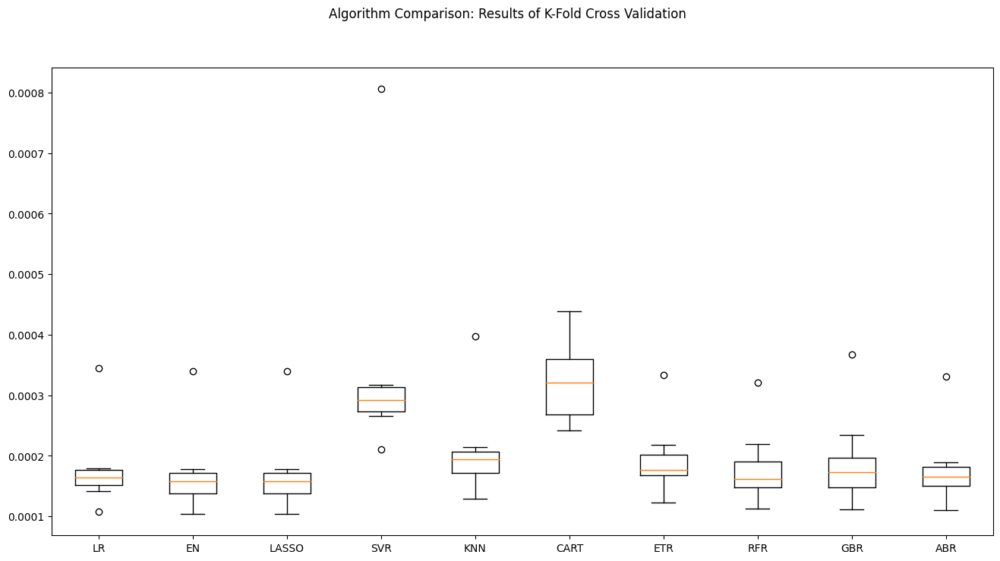

In [133]:
fig = plt.figure(figsize = [16, 8]
                )

fig.suptitle("Algorithm Comparison: Results of K-Fold Cross Validation")

ax = fig.add_subplot(111)

plt.boxplot(kfold_results)

ax.set_xticklabels(names)

plt.show()

#### ARIMA

In [134]:
# Basic Set-up for ARIMA

X_train_ARIMA =\
    (X_train
    .loc[ : , :]
   )

X_test_ARIMA =\
    (X_test
    .loc[ : , :]
)    

train_len = len(X_train_ARIMA)
test_len = len(X_test_ARIMA)
total_len = len(X)

In [135]:
modelARIMA =\
(    stats
     .ARIMA(endog = Y_train,
                exog = X_train_ARIMA,
                order = [1, 0, 0]   # Hyperparameters to be tuned
            )
)

model_fit = modelARIMA.fit()

In [136]:
error_training_ARIMA =\
(    mean_squared_error(Y_train,
                       model_fit.fittedvalues)
)

predicted =\
(
    model_fit
    .predict(start = train_len - 1,
             end = total_len - 1,
             exog = X_test_ARIMA)[1: ]
)

In [137]:
error_testing_ARIMA =\
(    mean_squared_error(Y_test,
                        predicted)
)

error_testing_ARIMA

0.0006933231889034882

In [138]:
test_results.append(error_testing_ARIMA)

train_results.append(error_training_ARIMA)

names.append("ARIMA")

#### Comparison of Algorithms

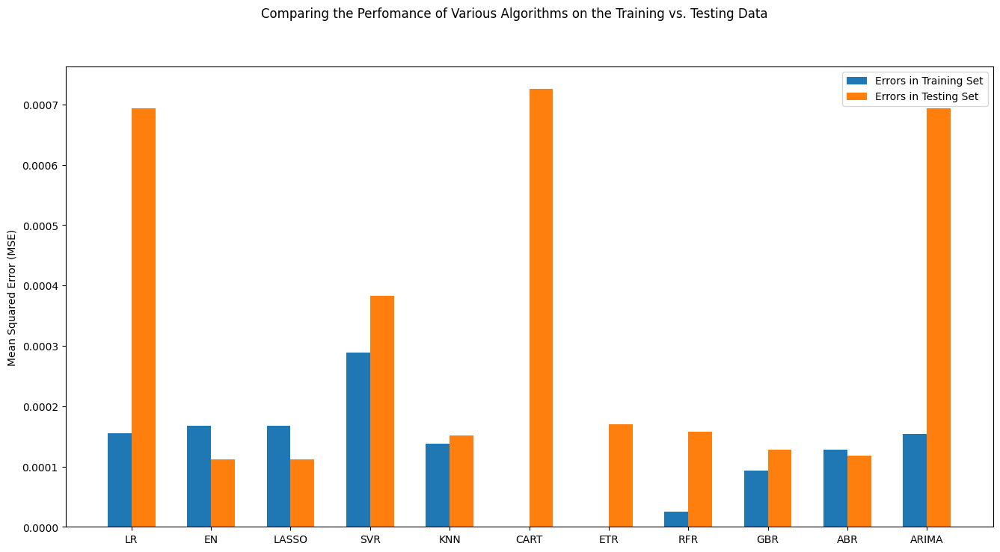

In [139]:
fig = plt.figure(figsize = [16, 8])

ind = np.arange(len(names)
               )

width = 0.30

fig.suptitle("Comparing the Perfomance of Various Algorithms on the Training vs. Testing Data")

ax = fig.add_subplot(111)

(plt
 .bar(ind - width/2,
    
      # Team, this line calculates the starting x position of the bars 
      # representing "Errors in Training Set". 
      # The width/2 term is used to shift the bars to the left, 
      # so they are centered around the tick mark for each group (algorithm) on the x-axis.
      
      # The bar chart will have two sets of bars for each algorithm: 
      # one for training errors and one for testing errors. 
      
      # By subtracting width/2 from ind, 
      # the training error bars are positioned to the left of the center of the tick marks. 
      
      train_results,
      width = width,
      label = "Errors in Training Set")
)

(plt
 .bar(ind + width/2,
      test_results,
      width = width,
      label = "Errors in Testing Set")
)

plt.legend()

ax.set_xticks(ind)
ax.set_xticklabels(names)

plt.ylabel("Mean Squared Error (MSE)")

plt.show()

#### Get predicted results from chosen model

In [140]:
model=Lasso()

In [141]:
# Fitting the Model on the Entire Training Set:
  
res = model.fit(X_train, Y_train) # The model is trained on the entire training dataset.

### Evaluating Model on Training Set:

# The trained model’s predictions on the training set are evaluated 
# using the mean squared error, and the result is appended to train_results.

train_result = res.predict(X_train)


## Evaluating Model on Testing Set:    

# Similarly, the model’s performance is evaluated 
# on the testing set and appended to test_results.

test_result = res.predict(X_test)

In [142]:
Train_result = pd.DataFrame(data=train_result,
                            index=X_train.index, 
                            columns=["Result"])

In [143]:
Test_result = pd.DataFrame(data=test_result, 
                            index=X_test.index, 
                            columns=["Result"])

In [144]:
Overall_results = pd.concat([Train_result, Test_result], 
                            axis=0)
Overall_results

,Result
Date,
2007-03-01,0.000321
2007-03-02,0.000321
2007-03-05,0.000157
2007-03-06,0.000157
2007-03-07,0.000157
...,...
2024-10-25,0.000056
2024-10-28,-0.000035
2024-10-29,-0.000035


In [145]:
Temp_df = pd.merge(Combined_overall_df,Overall_results,
                       left_index=True,
                       right_index=True)

In [146]:
Temp_df

,D1_forward_return,M1_return,M2_return,M3_return,M4_return,M5_return,M6_return,M7_return,M8_return,M9_return,...,Crude_10M,Gold_10M,Copper_10M,Crude_11M,Gold_11M,Copper_11M,Crude_12M,Gold_12M,Copper_12M,Result
Date,,,,,,,,,,,,,,,,,,,,,
2007-03-01,-0.013181,-0.016096,-0.014134,0.020542,0.017945,0.054937,0.084387,0.103349,0.128911,0.122558,...,-0.142225,-0.005406,-0.201022,-0.071022,0.123685,0.061894,-0.026229,0.170141,0.205772,0.000321
2007-03-02,-0.009565,-0.035979,-0.025208,0.003035,0.011052,0.042129,0.070056,0.091184,0.095731,0.098257,...,-0.118673,-0.048502,-0.250487,-0.069304,0.094710,0.046435,-0.012338,0.156064,0.223535,0.000321
2007-03-05,0.016964,-0.051508,-0.030615,-0.016905,0.002213,0.033388,0.059879,0.086559,0.086088,0.079170,...,-0.144180,-0.066696,-0.261051,-0.104369,0.083007,0.011416,-0.024521,0.151981,0.215919,0.000157
2007-03-06,-0.001002,-0.035925,-0.011884,-0.000368,0.019323,0.054103,0.076996,0.096786,0.098975,0.094039,...,-0.130142,-0.050162,-0.250867,-0.106712,0.081653,0.009154,0.011163,0.186728,0.243268,0.000157
2007-03-07,0.008419,-0.037204,-0.015005,0.000838,0.025093,0.050999,0.070041,0.093133,0.103701,0.107718,...,-0.125477,-0.069774,-0.250000,-0.082653,0.105710,0.038008,0.022325,0.192667,0.257428,0.000157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-25,0.003087,0.011708,0.033715,0.064089,0.061138,0.095137,0.136662,0.107749,0.142384,0.181652,...,-0.050152,0.331698,0.113978,-0.049775,0.368944,0.143026,-0.137363,0.379277,0.216057,0.000056
2024-10-28,0.001617,0.016246,0.042624,0.072255,0.068167,0.105250,0.136213,0.111026,0.146793,0.176850,...,-0.090811,0.317498,0.098516,-0.099920,0.363406,0.151362,-0.212298,0.379312,0.192075,-0.000035
2024-10-29,-0.003030,0.013864,0.044152,0.057748,0.067728,0.113523,0.153798,0.114385,0.144822,0.179241,...,-0.063536,0.334876,0.107207,-0.120403,0.357258,0.139832,-0.183453,0.386835,0.187149,-0.000035


<Axes: xlabel='Date'>

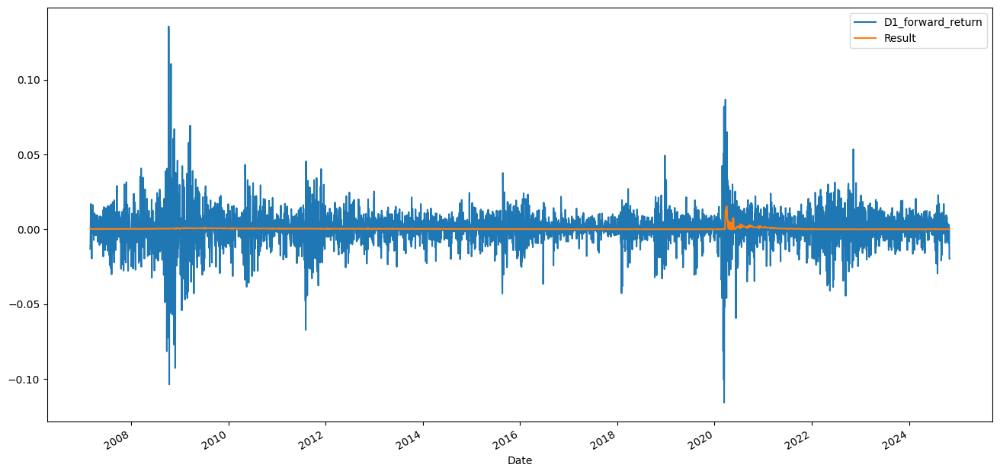

In [147]:
Temp_df \
    [["D1_forward_return", "Result"]] \
    .plot(figsize = (16, 8)
         )

### <a id = "p5f">5f.</a>  <font color = "green"> LightGBM </font>  [back to table of contents](#top)

In [148]:
Combined_overall_df

,D1_forward_return,M1_return,M2_return,M3_return,M4_return,M5_return,M6_return,M7_return,M8_return,M9_return,...,Copper_9M,Crude_10M,Gold_10M,Copper_10M,Crude_11M,Gold_11M,Copper_11M,Crude_12M,Gold_12M,Copper_12M
Date,,,,,,,,,,,,,,,,,,,,,
2007-03-01,-0.013181,-0.016096,-0.014134,0.020542,0.017945,0.054937,0.084387,0.103349,0.128911,0.122558,...,-0.253241,-0.142225,-0.005406,-0.201022,-0.071022,0.123685,0.061894,-0.026229,0.170141,0.205772
2007-03-02,-0.009565,-0.035979,-0.025208,0.003035,0.011052,0.042129,0.070056,0.091184,0.095731,0.098257,...,-0.270387,-0.118673,-0.048502,-0.250487,-0.069304,0.094710,0.046435,-0.012338,0.156064,0.223535
2007-03-05,0.016964,-0.051508,-0.030615,-0.016905,0.002213,0.033388,0.059879,0.086559,0.086088,0.079170,...,-0.258474,-0.144180,-0.066696,-0.261051,-0.104369,0.083007,0.011416,-0.024521,0.151981,0.215919
2007-03-06,-0.001002,-0.035925,-0.011884,-0.000368,0.019323,0.054103,0.076996,0.096786,0.098975,0.094039,...,-0.265833,-0.130142,-0.050162,-0.250867,-0.106712,0.081653,0.009154,0.011163,0.186728,0.243268
2007-03-07,0.008419,-0.037204,-0.015005,0.000838,0.025093,0.050999,0.070041,0.093133,0.103701,0.107718,...,-0.196987,-0.125477,-0.069774,-0.250000,-0.082653,0.105710,0.038008,0.022325,0.192667,0.257428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-25,0.003087,0.011708,0.033715,0.064089,0.061138,0.095137,0.136662,0.107749,0.142384,0.181652,...,0.126996,-0.050152,0.331698,0.113978,-0.049775,0.368944,0.143026,-0.137363,0.379277,0.216057
2024-10-28,0.001617,0.016246,0.042624,0.072255,0.068167,0.105250,0.136213,0.111026,0.146793,0.176850,...,0.118513,-0.090811,0.317498,0.098516,-0.099920,0.363406,0.151362,-0.212298,0.379312,0.192075
2024-10-29,-0.003030,0.013864,0.044152,0.057748,0.067728,0.113523,0.153798,0.114385,0.144822,0.179241,...,0.109049,-0.063536,0.334876,0.107207,-0.120403,0.357258,0.139832,-0.183453,0.386835,0.187149


In [149]:
# Preparing Data for LightGBM
LightGBM_train_df=X_train.reset_index(drop=True)

LightGBM_target_df=Y_train

LightGBM_test_df=X_test.reset_index(drop=True)

# Feature Preprocessing
# Feature Scaling: Fit on Training Data, Transform on Both
scaler = MinMaxScaler()
LightGBM_train_df_transformed = scaler.fit_transform(LightGBM_train_df)  # Fit and transform on training data
LightGBM_test_df_transformed = scaler.transform(LightGBM_test_df)        # Transform test data

LightGBM_train_df=pd.DataFrame(data=LightGBM_train_df_transformed,
                        columns=LightGBM_train_df.columns,
                        index=LightGBM_train_df.index)

LightGBM_test_df=pd.DataFrame(data=LightGBM_test_df_transformed,
                        columns=LightGBM_test_df.columns,
                        index=LightGBM_test_df.index)

# Setting Up Training and Testing Features
training_features_df = LightGBM_train_df  
testing_features_df = LightGBM_test_df    

# Prepare the target variables
training_target = LightGBM_target_df

# # Set up Optuna study to maximize R² score
# # https://optuna.readthedocs.io/en/stable/reference/generated/optuna.create_study.html
# study = optuna.create_study(direction="maximize", 
#                             sampler=optuna.samplers.TPESampler(),  # https://optuna.readthedocs.io/en/stable/reference/samplers/index.html
#                             pruner=optuna.pruners.MedianPruner())  # https://optuna.readthedocs.io/en/stable/reference/pruners.html

# Initialize Optuna study to minimize RMSE
study = optuna.create_study(direction="minimize",  # Changed from 'maximize' to 'minimize'
                        sampler=optuna.samplers.TPESampler(), 
                        pruner=optuna.pruners.MedianPruner())

# Optimize with Optuna
study.optimize(lambda trial: LightGBM_optuna_objective(trial, 
                                            training_features_df, 
                                            training_target), 
            n_trials=40) # Number of trials can be adjusted, lesser = faster

# Best parameters found by Optuna
best_params = study.best_params

# Initialize the LightGBM model with the best parameters
best_model = lgb.LGBMRegressor(**best_params,
                                verbose=-1)

# Fit the best model on the training data
best_model.fit(training_features_df, 
            training_target,
            eval_set=[(training_features_df,training_target)],     # You can add a validation set here instead
            eval_metric="rmse",                                    # Or use any other relevant metric: 'mae', 'r2', etc.
            callbacks=[lgb.log_evaluation(0)]
            )                                  

# Make predictions on training data
LightGBM_results_train = best_model.predict(training_features_df)

# Make predictions on testing data
LightGBM_results_test = best_model.predict(testing_features_df)

LightGBM_results = np.concatenate((LightGBM_results_train, LightGBM_results_test))

# Extract the first split variable of the first tree
model_dump = best_model.booster_.dump_model()
first_tree = model_dump['tree_info'][0]['tree_structure']
if 'split_feature' in first_tree:
    split_feature_index = first_tree['split_feature']
    feature_names = best_model.booster_.feature_name()
    first_split_feature_name = feature_names[split_feature_index]
else:
    split_feature_index = None
    feature_names = None
    first_split_feature_name = None  # or 'No splits'


# Get the LightGBM split results as a dataframe
LightGBM_splits_df=trees_to_dataframe(best_model)

# Plotting the Tree Diagram
try:
    Tree_image = lgb.create_tree_digraph(best_model, 
                                    tree_index=0, 
                                    orientation='vertical',
                                    show_info=['split_gain', 
                                                'internal_value', 
                                                'internal_count', 
                                                'leaf_count'])
    
    # https://stackoverflow.com/questions/61894279/writing-create-tree-digraph-plot-to-a-png-file-in-python
    # https://discourse.pymc.io/t/saving-graphviz-and-arviz-outputs/4317
    Tree_image.render(filename=f"SPY_First_Tree", format="png", cleanup=True)
except:
    Tree_image = None
    #print("Failed to plot tree, most likely tree failed to split")

LightGBM_predicted_returns_df = pd.DataFrame(data=LightGBM_results,
                                             index=Combined_overall_df.index,
                                             columns=["LGB_SPY_Predicted_Returns"])

# Save results to csv
LightGBM_splits_df.to_csv(path_or_buf=f"SPY_LightGBM_splits_df.csv")
LightGBM_predicted_returns_df.to_csv(path_or_buf="LightGBM_predicted_returns_df.csv")
    
# Clearing GPU Memory
del (LightGBM_train_df, 
        LightGBM_target_df, 
        LightGBM_test_df,   
        training_features_df,
        testing_features_df,
        training_target,
        best_model, 
        LightGBM_results,
        model_dump,
        first_tree,
        split_feature_index,
        feature_names,
        first_split_feature_name,
        LightGBM_splits_df,
        Tree_image,
        )

gc.collect()  

[I 2024-11-21 08:12:33,486] A new study created in memory with name: no-name-5a150395-e5bf-4dbd-a630-e27daf22414d
[I 2024-11-21 08:12:39,265] Trial 0 finished with value: 0.007370527332888627 and parameters: {'max_depth': 83, 'num_leaves': 120, 'min_split_gain': 0.3383489587821889, 'reg_alpha': 0.02305022564297924, 'reg_lambda': 7.503311009304582, 'learning_rate': 0.5202541909760962, 'n_estimators': 3000, 'colsample_bytree': 0.2958725547006523, 'subsample': 0.5385779721930614, 'min_child_samples': 63, 'min_child_weight': 2.189431487456306}. Best is trial 0 with value: 0.007370527332888627.
[I 2024-11-21 08:12:44,300] Trial 1 finished with value: 0.007370527332888627 and parameters: {'max_depth': 91, 'num_leaves': 143, 'min_split_gain': 0.18228471719871464, 'reg_alpha': 0.017202058896963884, 'reg_lambda': 0.06484509939522863, 'learning_rate': 0.6949587191429953, 'n_estimators': 2852, 'colsample_bytree': 0.22352199249466412, 'subsample': 0.9733061046744025, 'min_child_samples': 8, 'min_c

160

In [150]:
LightGBM_predicted_returns_df

,LGB_SPY_Predicted_Returns
Date,
2007-03-01,0.000385
2007-03-02,0.000385
2007-03-05,0.000385
2007-03-06,0.000385
2007-03-07,0.000385
...,...
2024-10-25,0.000385
2024-10-28,0.000385
2024-10-29,0.000385


In [151]:
LightGBM_strategy = pd.merge(left=SPY_info,
                             right=LightGBM_predicted_returns_df,
                             left_index=True,
                             right_index=True,
                             how="inner")

In [152]:
LightGBM_strategy 

,Adj Close,SPY_log_returns,SPY_cumulative_returns,LGB_SPY_Predicted_Returns
Date,,,,
2007-03-01,100.286766,-0.002985,119401.554616,0.000385
2007-03-02,98.973526,-0.013181,117838.009296,0.000385
2007-03-05,98.031387,-0.009565,116716.297763,0.000385
2007-03-06,99.708626,0.016964,118713.220069,0.000385
2007-03-07,99.608734,-0.001002,118594.288925,0.000385
...,...,...,...,...
2024-10-25,579.039978,-0.000345,689405.753949,0.000385
2024-10-28,580.830017,0.003087,691536.976794,0.000385
2024-10-29,581.770020,0.001617,692656.144929,0.000385


In [153]:
# We shift the position forward by one here, as we were predicting one day ahead returns

LightGBM_strategy ["Position"] = np.sign(LightGBM_strategy ["LGB_SPY_Predicted_Returns"].shift(1))

In [154]:
# This is to ensure a long-only strategy
# Comment this cell out if you want to do long-short

# LightGBM_strategy["Position"] = np.where(LightGBM_strategy["Position"]==-1,
#                                             0,
#                                             LightGBM_strategy["Position"])

In [155]:
LightGBM_strategy["Trades"] =\
                            (
                                LightGBM_strategy["Position"]
                                .diff()
                            )

In [156]:
LightGBM_strategy["strategy_returns"] =\
    (
        LightGBM_strategy["Position"]
        * 
        LightGBM_strategy["SPY_log_returns"]
    )

In [157]:
LightGBM_strategy = calc_portfolio_statistics(portfolio_df=LightGBM_strategy,
                                SP500=SPY_info,
                                portfolio_name=f"LightGBM Strategy")

During this period, LightGBM Strategy Cumulative Return was 567.01%
During this period, LightGBM Strategy Annualized Return was 10.32%
During this period, LightGBM Strategy Annualized Standard Deviation was 19.9%
During this period, LightGBM Strategy Sharpe Ratio was 0.52
During this period, LightGBM Strategy Sortino Ratio was 0.62
During this period, LightGBM Strategy Calmar Ratio was 0.19
During this period, LightGBM Strategy Treynor Ratio was 10.32
During this period, LightGBM Strategy Max Drawdown was -55.19%
During this period, LightGBM Strategy Max Drawdown Duration was 1772 days
During this period, LightGBM Strategy 1 day VaR at the 99% CI was -4.0 %
During this period, LightGBM Strategy 1 month VaR at the 99% CI was -17.0 %
During this period, LightGBM Strategy 1 year VaR at the 99% CI was -57.99999999999999 %
During this period, LightGBM Strategy Information Ratio against SP500 was -inf
The past 12m LightGBM Strategy Rolling Beta against SP500 was 1.0


In [158]:
# Calculate the capital
LightGBM_strategy["Capital"]=initial_capital*LightGBM_strategy["CumulativeStrategyReturns"]

In [159]:
#Cumulative Returns of LightGBM Strategy alongside SPY
plot_chart_with_SPY(portfolio_df = LightGBM_strategy["Capital"],
                    SPY_info = SPY_info,
                    chart_title=("LightGBM Strategy vs SPY Cumulative Returns"))

In [160]:
plot_chart_with_buy_sell(portfolio_df = LightGBM_strategy, 
                        chart_title = "Buy Sell positions of LightGBM Strategy")

In [161]:
plot_chart_with_drawdown(portfolio_df = LightGBM_strategy, 
                         chart_title = "Drawdown of LightGBM Strategy")

### <a id = "p5g">5g.</a>  <font color = "green"> XGBoost </font>  [back to table of contents](#top)

In [162]:
# Preparing Data for XGBoost
XGBoost_train_df=X_train.reset_index(drop=True)

XGBoost_target_df=Y_train

XGBoost_test_df=X_test.reset_index(drop=True)

# Feature Preprocessing
# Feature Scaling: Fit on Training Data, Transform on Both
scaler = MinMaxScaler()
XGBoost_train_df_transformed = scaler.fit_transform(XGBoost_train_df)  # Fit and transform on training data
XGBoost_test_df_transformed = scaler.transform(XGBoost_test_df)        # Transform test data

XGBoost_train_df=pd.DataFrame(data=XGBoost_train_df_transformed,
                        columns=XGBoost_train_df.columns,
                        index=XGBoost_train_df.index)

XGBoost_test_df=pd.DataFrame(data=XGBoost_test_df_transformed,
                        columns=XGBoost_test_df.columns,
                        index=XGBoost_test_df.index)

# Setting Up Training and Testing Features
training_features_df = XGBoost_train_df  
testing_features_df = XGBoost_test_df    

# Prepare the target variables
training_target = XGBoost_target_df

# # Set up Optuna study to maximize R² score
# study = optuna.create_study(direction="maximize",                        # Be careful to change maximize or minimize
#                             sampler=optuna.samplers.TPESampler(),        # https://optuna.readthedocs.io/en/stable/reference/samplers/generated/optuna.samplers.TPESampler.html
#                             pruner=optuna.pruners.MedianPruner())        # https://optuna.readthedocs.io/en/stable/reference/generated/optuna.pruners.MedianPruner.html

# Initialize Optuna study to minimize RMSE
study = optuna.create_study(direction="minimize",                      # Changed from 'maximize' to 'minimize'
                            sampler=optuna.samplers.TPESampler(),      # can set seed here
                            pruner=optuna.pruners.MedianPruner())


# Optimize with Optuna
study.optimize(lambda trial: XGBoost_optuna_objective(trial, 
                                                        training_features_df, 
                                                        training_target), 
            n_trials=40) # Number of trials can be adjusted, lesser = faster

# Best parameters found by Optuna
best_params = study.best_params

# Initialize the XGBoost model with the best parameters
best_model = XGBRegressor(**best_params,
                        objective="reg:squarederror", 
                        random_state=627,
                        verbosity=0,
                        early_stopping_rounds = 100)

# Fit the best model on the training data
# https://xgboost.readthedocs.io/en/stable/python/python_api.html#fit
best_model.fit(training_features_df, 
            training_target,
            eval_set=[(training_features_df,training_target)],     # You can add a validation set here instead
            verbose = False
            )                                    

# Make predictions on training data
XGBoost_results_train = best_model.predict(training_features_df)

# Make predictions on testing data
XGBoost_results_test = best_model.predict(testing_features_df)

XGBoost_results = np.concatenate((XGBoost_results_train,XGBoost_results_test))

# Extract the first split variable of the first tree
# https://xgboost.readthedocs.io/en/stable/python/python_api.html#dump_model
# https://stackoverflow.com/questions/50175901/how-to-extract-decision-rules-features-splits-from-xgboost-model-in-python3
model_dump = best_model.get_booster().get_dump(with_stats=True)
first_tree = model_dump[0]  # Extract the first tree as text

split_feature_name = None
try:
    # Parse the first non-empty line containing a split
    split_line = next(line for line in first_tree.split('\n') if '[' in line)

    # Extract the feature index from the split line
    split_feature = split_line.split('[')[-1].split(']')[0]
    split_feature_name = (split_feature.split('<')[0])

except (IndexError, ValueError, StopIteration):
    # Handle cases with no splits or malformed dumps
    split_feature_name = 'No splits available'
    

# Get the XGBoost split results as a dataframe
# https://xgboost.readthedocs.io/en/stable/python/python_api.html
XGBoost_splits_df = best_model.get_booster().trees_to_dataframe()

# Plot the first tree if possible
# https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.to_graphviz
try:
    Tree_image = xg.to_graphviz(best_model, num_trees=0)
    Tree_image.render(filename=f"SPY_First_Tree_for_XGBoost", format="png", cleanup=True)
except Exception as e:
    Tree_image = None
    print(f"Failed to plot tree: {e}")

XGBoost_predicted_returns_df=pd.DataFrame(data=XGBoost_results,
                                          index=Combined_overall_df.index,
                                          columns=["XGB_SPY_Predicted_Returns"])

# Save results to csv
XGBoost_splits_df.to_csv(path_or_buf=f"SPY_XGBoost_splits_df.csv")
XGBoost_predicted_returns_df.to_csv(path_or_buf="XGBoost_predicted_returns_df.csv")
    
# Clearing GPU Memory
del (XGBoost_train_df, 
    XGBoost_target_df, 
    XGBoost_test_df,   
    training_features_df,
    testing_features_df,
    training_target,
    best_model, 
    XGBoost_results,
    model_dump,
    first_tree,
    split_feature_name,
    XGBoost_splits_df,
    Tree_image,
    )

gc.collect()  

[I 2024-11-21 08:15:29,496] A new study created in memory with name: no-name-f30f89c4-8915-4fee-b50d-211002893d6d
[I 2024-11-21 08:15:37,639] Trial 0 finished with value: 0.008761943137722028 and parameters: {'max_depth': 13, 'num_leaves': 63, 'min_split_gain': 0.017167364913217097, 'reg_alpha': 3.877397762808393e-06, 'reg_lambda': 1.5848791707726225e-06, 'learning_rate': 0.045315271823848036, 'n_estimators': 296, 'min_child_samples': 90, 'min_child_weight': 1.0154078054572522}. Best is trial 0 with value: 0.008761943137722028.
[I 2024-11-21 08:15:43,779] Trial 1 finished with value: 0.007892693147693286 and parameters: {'max_depth': 13, 'num_leaves': 8, 'min_split_gain': 0.06118105210915909, 'reg_alpha': 0.07935989258143758, 'reg_lambda': 0.0002730179302272908, 'learning_rate': 0.024029184740473906, 'n_estimators': 150, 'min_child_samples': 60, 'min_child_weight': 0.19934402278494825}. Best is trial 1 with value: 0.007892693147693286.
[I 2024-11-21 08:15:46,606] Trial 2 finished with 

32023

In [163]:
XGBoost_predicted_returns_df

,XGB_SPY_Predicted_Returns
Date,
2007-03-01,-0.001056
2007-03-02,-0.000335
2007-03-05,0.003596
2007-03-06,-0.000335
2007-03-07,0.001711
...,...
2024-10-25,-0.000211
2024-10-28,-0.000211
2024-10-29,-0.000621


In [164]:
XGBoost_strategy = pd.merge(left=SPY_info,
                             right=XGBoost_predicted_returns_df,
                             left_index=True,
                             right_index=True,
                             how="inner")

In [165]:
XGBoost_strategy

,Adj Close,SPY_log_returns,SPY_cumulative_returns,XGB_SPY_Predicted_Returns
Date,,,,
2007-03-01,100.286766,-0.002985,119401.554616,-0.001056
2007-03-02,98.973526,-0.013181,117838.009296,-0.000335
2007-03-05,98.031387,-0.009565,116716.297763,0.003596
2007-03-06,99.708626,0.016964,118713.220069,-0.000335
2007-03-07,99.608734,-0.001002,118594.288925,0.001711
...,...,...,...,...
2024-10-25,579.039978,-0.000345,689405.753949,-0.000211
2024-10-28,580.830017,0.003087,691536.976794,-0.000211
2024-10-29,581.770020,0.001617,692656.144929,-0.000621


In [166]:
# We shift the position forward by one here, as we were predicting one day ahead returns

XGBoost_strategy ["Position"] = np.sign(XGBoost_strategy ["XGB_SPY_Predicted_Returns"].shift(1))

In [167]:
# This is to ensure a long-only strategy
# Comment this cell out if you want to do long-short

# XGBoost_strategy["Position"] = np.where(XGBoost_strategy["Position"]==-1,
#                                             0,
#                                             XGBoost_strategy["Position"])

In [168]:
XGBoost_strategy["Trades"] =\
                            (
                                XGBoost_strategy["Position"]
                                .diff()
                            )

In [169]:
XGBoost_strategy["strategy_returns"] =\
    (
        XGBoost_strategy["Position"]
        * 
        XGBoost_strategy["SPY_log_returns"]
    )

In [170]:
XGBoost_strategy = calc_portfolio_statistics(portfolio_df=XGBoost_strategy,
                                SP500=SPY_info,
                                portfolio_name=f"XGBoost Strategy")

During this period, XGBoost Strategy Cumulative Return was 8245886109.26%
During this period, XGBoost Strategy Annualized Return was 180.59%
During this period, XGBoost Strategy Annualized Standard Deviation was 18.82%
During this period, XGBoost Strategy Sharpe Ratio was 9.6
During this period, XGBoost Strategy Sortino Ratio was 18.84
During this period, XGBoost Strategy Calmar Ratio was 7.85
During this period, XGBoost Strategy Treynor Ratio was 564.34
During this period, XGBoost Strategy Max Drawdown was -23.01%
During this period, XGBoost Strategy Max Drawdown Duration was 525 days
During this period, XGBoost Strategy 1 day VaR at the 99% CI was -2.0 %
During this period, XGBoost Strategy 1 month VaR at the 99% CI was -10.0 %
During this period, XGBoost Strategy 1 year VaR at the 99% CI was -33.0 %
During this period, XGBoost Strategy Information Ratio against SP500 was 2.66
The past 12m XGBoost Strategy Rolling Beta against SP500 was 0.32


In [171]:
# Calculate the capital
XGBoost_strategy["Capital"]=initial_capital*XGBoost_strategy["CumulativeStrategyReturns"]

In [172]:
XGBoost_strategy.iloc[200:,:]

,Adj Close,SPY_log_returns,SPY_cumulative_returns,XGB_SPY_Predicted_Returns,Position,Trades,strategy_returns,Returns,CumulativeStrategyReturns,HighWaterMark,Drawdown,MaxDrawdown,HighWaterMarkDate,DrawdownDuration,MaximumDrawdownDuration,Rolling beta,Capital
Date,,,,,,,,,,,,,,,,,
2007-12-14,106.413841,-0.012760,126696.458344,-0.000503,-1.0,0.0,0.012760,0.012760,3.044136e+00,3.044136e+00,0.000000,-0.019654,2007-12-14,0 days,11 days,NaN,3.044136e+05
2007-12-17,104.895378,-0.014372,124888.574153,0.002073,-1.0,0.0,0.014372,0.014372,3.088203e+00,3.088203e+00,0.000000,-0.019654,2007-12-17,0 days,11 days,NaN,3.088203e+05
2007-12-18,105.481056,0.005568,125585.883265,-0.000091,1.0,2.0,0.005568,0.005568,3.105446e+00,3.105446e+00,0.000000,-0.019654,2007-12-18,0 days,11 days,NaN,3.105446e+05
2007-12-19,105.481056,0.000000,125585.883265,-0.000091,-1.0,-2.0,-0.000000,-0.000000,3.105446e+00,3.105446e+00,0.000000,-0.019654,2007-12-19,0 days,11 days,NaN,3.105446e+05
2007-12-20,106.146294,0.006287,126377.915814,0.000665,-1.0,0.0,-0.006287,-0.006287,3.085984e+00,3.105446e+00,-0.006267,-0.019654,2007-12-19,1 days,11 days,NaN,3.085984e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-25,579.039978,-0.000345,689405.753949,-0.000211,-1.0,0.0,0.000345,0.000345,8.097784e+07,8.900905e+07,-0.090229,-0.230100,2024-08-02,84 days,525 days,0.378314,8.097784e+12
2024-10-28,580.830017,0.003087,691536.976794,-0.000211,-1.0,0.0,-0.003087,-0.003087,8.072828e+07,8.900905e+07,-0.093033,-0.230100,2024-08-02,87 days,525 days,0.370436,8.072828e+12
2024-10-29,581.770020,0.001617,692656.144929,-0.000621,-1.0,0.0,-0.001617,-0.001617,8.059784e+07,8.900905e+07,-0.094498,-0.230100,2024-08-02,88 days,525 days,0.369040,8.059784e+12


In [173]:
#Cumulative Returns of LightGBM Strategy alongside SPY
plot_chart_with_SPY(portfolio_df = XGBoost_strategy["Capital"],
                    SPY_info = SPY_info,
                    chart_title=("XGBoost Strategy vs SPY Cumulative Returns"))

In [174]:
plot_chart_with_buy_sell(portfolio_df = XGBoost_strategy, 
                        chart_title = "Buy Sell positions of XGBoost Strategy")

In [175]:
plot_chart_with_drawdown(portfolio_df = XGBoost_strategy, 
                         chart_title = "Drawdown of XGBoost Strategy")